#https://pypi.org/project/pdftotext/ via that URL I used the information on how to transform a pdf into txt file, I had to install homebrew and then >pip install pdftotext< to start with the library

In [2]:
import sys
sys.executable


'/Applications/miniconda3/envs/nlp/bin/python'

In [3]:
import pandas as pd
import numpy as np 

In [4]:
import pdftotext
import os


I manually cleaned some data in the pdf files (removing references and table of content) to avoid additional work later, after my pdf files are transformed into text files. The goal is to use previously used code (week 5), to open every file in the folder and then modify it to a text file one by one, through code. The text files will all be saved in one document (one for Chat-GPT Written and one for Human written)

Another method is to extract the pdf text page by page 

In [23]:
#Add Week 5 code to upload all documents: 
path= '/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays_PDF'


def load_all_text_files_in_folder(path):
    corpus = ''
    # Find all files in the folder or subfolders
    for root, _, files in os.walk(path):
        for i, file in enumerate(files):
            # If the file is a pdf file till here it was from week 5
            if file.endswith(".pdf"):
                #reading the text from each pdf 
                fpath = os.path.join(root,file)
                with open(fpath, "rb") as f: #(I used pfdtotext as described in URL above)
                    pdf_files = pdftotext.PDF(f)
                
          

                    # Iterate over all the pages
                    for page in pdf_files:
                        corpus += page
                        # Add paragraph between the different documents
                        corpus += '\n\n'
                        print(page)
                        
                    # Read all the text into one string
                    #print("\n\n".join(pdf))
    return corpus
    


    
Chat_GPT_Essays_combined = load_all_text_files_in_folder(path)

#Now we save the text file as a new document

f=open ("Chat_GPT_Essays_combined", "w")
f.write(Chat_GPT_Essays_combined)
f.close()

#print(Chat_GPT_Essays_combined[1000]) #print first 1000 characters 

Now we will do the same thing for the human essays I downloaded and manually cleaned up (I removed bibliography and table of contents)

In [24]:
#Add Week 5 code to upload all documents: 
path= '/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertationsPDF'


def load_all_text_files_in_folder(path):
    corpus = ''
    # Find all files in the folder or subfolders
    for root, _, files in os.walk(path):
        for i, file in enumerate(files):
            # If the file is a pdf file till here it was from week 5
            if file.endswith(".pdf"):
                #reading the text from each pdf 
                fpath = os.path.join(root,file)
                with open(fpath, "rb") as f: #(I used pfdtotext as described in the URL above)
                    pdf_files = pdftotext.PDF(f)
                    
          

                    # Iterate over all the pages
                    for page in pdf_files:
                        corpus += page
                        # Add paragraph between the different documents
                        corpus += '\n\n'
                        print(page)


              
                    # Read all the text into one string
                    #print("\n\n".join(pdf))
    return corpus



Human_Essays_combined = load_all_text_files_in_folder(path)

#Now we save the text file as a new document
f=open ("Human_Essays_combined", "w")
f.write(Human_Essays_combined)
f.close()

print(Human_Essays_combined[:1000]) #print first 1000 characters 

My original idea was the following: Now I have to analyse my text. I will start with removing all the stopwords from the documents as we learned in week 3 where we used stemming, lemmitizers and stopwords, I used code from the week 3 class notebook. And following explanation: https://spotintelligence.com/2022/12/10/stop-words-removal/#:~:text=To%20remove%20stopwords%20with%20Python,your%20own%20list%20of%20stopwords.&text=In%20this%20example%2C%20the%20NLTK,of%20stop%20words%20in%20English.

After encountering some difficulties with uploading my data, I had a tech tutorial with Mayra, I then established that there is a easier more efficent way to accomplish the comparison between Human written Essays and chat gpt written essays. In the next steps I will read my text documents, create lists, filter words , use stopwords and establish a graphic where the most common words are displayed bigger depending on repetition (Most frequent word with word cloud)

First I display my text file as a list 

In [25]:
generated_text = pd.read_table('/Users/jillcakmak/Documents/GitHub/NLP_Project/Chat_GPT_Essays_combined.txt', header=None, delimiter=None)
generated_text #I print text to see content 

,0
0,Nr7_Chat GPT
1,Title: Rewriting the Life of an “Ultra-Radical...
2,Memoirs of Margaret Fuller Ossoli (1852)
3,Introduction:
4,"In the mid-19th century, a wave of intellectua..."
...,...
635,delicate antennae. We witness the intricate ba...
636,the forces of nature. In the delicate flutter ...
637,the scarce swallowtails reveal the secrets of ...
638,at the beauty and complexity of life on Earth.


Now I can directly use the ntkl library for stopwords

In [26]:
import nltk
from nltk.corpus import stopwords
 
nltk.download('stopwords')
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jillcakmak/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


After I did the most frequent word plot for the first time, I could see some non-relevant words in the top lists, which is why I am removing those with my own stop word list which I called 'manual_stopwords'. As my datan is limited I manually clean it, for bigger datasets I would need to use code 

In [27]:
manual_stopwords = ['This', 'The', 'In', 'As', 'also', 'I', 'et', '&', 'would', 'al.', 'al.,' 'would', 'From', "Fuller's", 'It', 'A', "It's", 'OF','W.', 'may', 'He', '-', '=', ',', 'em', 'la', 'No', '.', 'one', 'Fuller:','(fig.','CHAPTER', 'I.', 'Z','de','p.', 'legitimacy.', '(and']

In [28]:
stop_words = set(stopwords.words('english') + manual_stopwords)

The next bits of code are mainly from the class (Week 4) modified to filter our a list of words for the Chat-GPT written text and later on for the human written text, I polished the code during my tutorial. 

In [29]:
# I define the string, in this case the text file of Chat-GPT Essays

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/Chat_GPT_Essays_combined.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Chat_GPT_Essays = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Chat_GPT_Essays.append(word) 
    
# Print the filtered list of words 
print(filtered_Chat_GPT_Essays[:1000])
print(len(filtered_Chat_GPT_Essays))

['Nr7_Chat', 'GPT', 'Title:', 'Rewriting', 'Life', '“Ultra-Radical”:', 'Margaret', 'Fuller,', 'Ralph', 'Waldo', 'Emerson,', 'Memoirs', 'Margaret', 'Fuller', 'Ossoli', '(1852)', 'Introduction:', 'mid-19th', 'century,', 'wave', 'intellectual', 'social', 'upheaval', 'swept', 'America,', 'challenging', 'conventional', 'norms', 'redefining', 'landscape', 'thought.', 'At', 'forefront', 'movement', 'figures', 'like', 'Margaret', 'Fuller,', '“ultra-radical”', 'thinker,', 'contemporary,', 'Ralph', 'Waldo', 'Emerson.', 'essay', 'delves', 'transformative', 'period', 'life,', 'influence', 'Emerson', 'intellectual', 'journey,', 'portrayal', 'legacy', 'posthumously', 'published', '"Memoirs', 'Margaret', 'Fuller', 'Ossoli"', '(1852).', 'Radical', 'Intellect', 'Margaret', 'Margaret', 'Fuller', 'emerged', 'leading', 'intellectual', 'force,', 'challenging', 'societal', 'norms', 'advocating', 'rights', 'women', 'male-dominated', 'society.', 'Her', 'transcendentalist', 'beliefs,', 'heavily', 'influenced',

Now I do the same thing with the Human Written Essays 

In [30]:
# Define string, here the text file of Human Essays

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/Human_Essays_combined.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_Essays = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_Essays.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_Essays[:1000])
print(len(filtered_Human_Essays))

['TOWARDS', 'AN', 'ECOSYSTEM', 'VIEW', 'LEGITIMACY', 'THIRD', 'SECTOR', 'ORGANISATIONS', 'ABSTRACT', 'study', 'aims', 'provide', 'better', 'understanding', 'legitimacy', 'legitimation', 'third', 'sector', 'organisations', '(TSOs).', 'integrating', 'insights', 'contemporary', 'legitimacy', 'literature', 'public', 'administration', 'management', 'literature', 'context', 'Scottish-based', 'TSOs', 'deliver', 'services', 'young', 'people.', 'Legitimacy', 'support', 'resource', 'acquisition', 'long-term', 'survival', 'TSOs.', 'Therefore,', 'legitimacy', 'taken', 'granted', 'must', 'actively', 'managed', 'gain', 'endorsement,', 'support,', 'resources', 'legitimating', 'environment.', 'However,', 'much', 'previous', 'non-profit', 'literature', 'tended', 'focus', 'study', 'dyads,', 'funder', 'often', 'viewed', 'main', 'constituency', 'grants', 'legitimacy', 'TSOs.', 'TSOs', 'complex', 'organisations', 'multiple', 'constituent', 'groups', 'different', 'interests.', 'non-profit', 'underpinnings',

In the next step Mayra showed me how to use the Wordcloud library to display the most frequent words of my data. I had my tutorial on Tuesday the 28.11.2023. 

In [27]:
#!pip install wordcloud

In [15]:
import wordcloud
print(wordcloud.__version__) #I had some errors at first as the pip install wordcloud wasn't enough in my terminal, so I wanted to check after !pip install wordcloud if everythig was installed correctly


1.9.2


In [31]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud



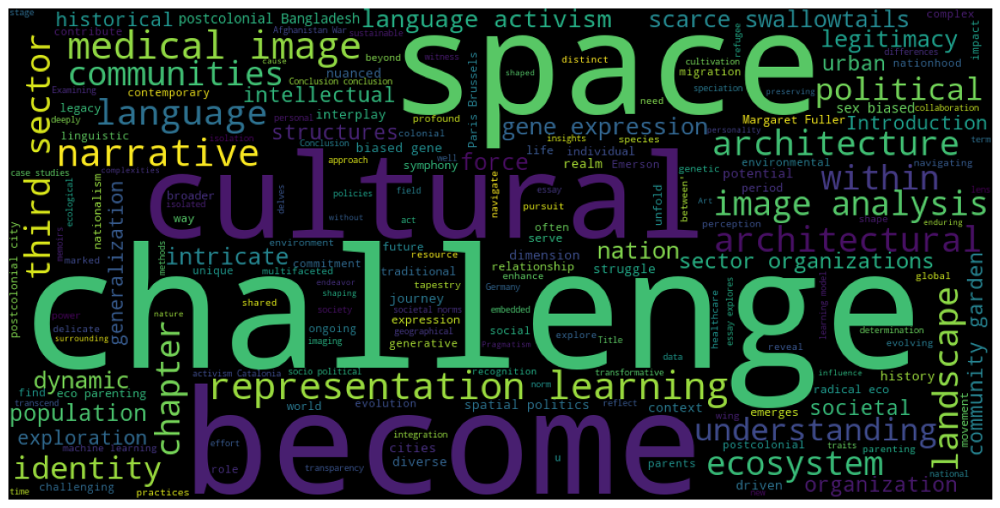

In [32]:
#convert list to string and generate
unique_string=(" ").join(filtered_Chat_GPT_Essays)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_combined"+".png", bbox_inches='tight')
plt.show()
plt.close()

Now I gonna do the same with my Human written data

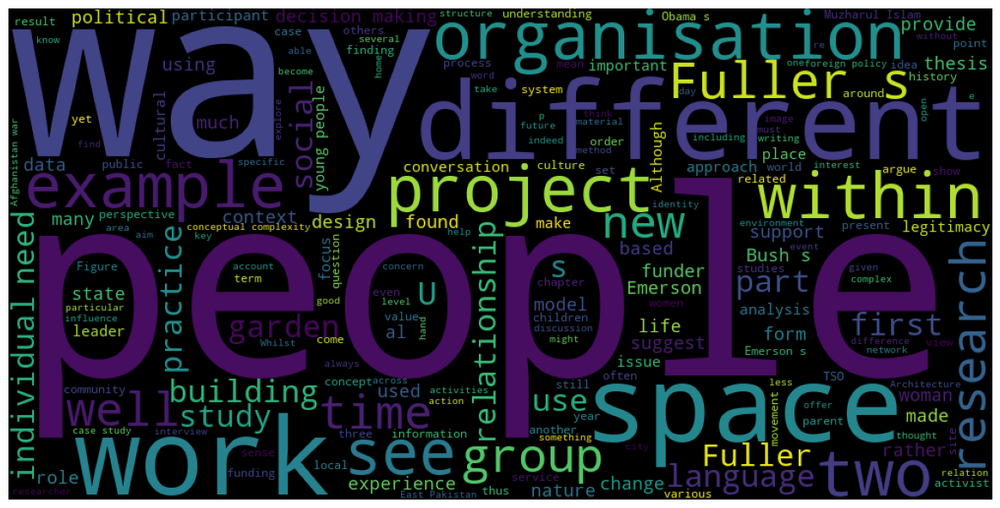

In [33]:
unique_string=(" ").join(filtered_Human_Essays)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_combined"+".png", bbox_inches='tight')
plt.show()
plt.close()

Now Mayra showed me an option how to display the list of word frequency 

In [34]:
from collections import Counter

GPT_overview = Counter(filtered_Chat_GPT_Essays)
GPT_overview

Counter({'postcolonial': 22,
         'language': 19,
         'medical': 19,
         'learning': 19,
         'societal': 16,
         'representation': 16,
         'architectural': 15,
         'cultural': 15,
         'becomes': 15,
         'challenges': 14,
         'within': 14,
         'organizations': 14,
         'intricate': 13,
         'expression': 13,
         'image': 13,
         'gene': 12,
         'scarce': 12,
         'radical': 11,
         'architecture': 11,
         'intellectual': 10,
         'essay': 10,
         'role': 10,
         'political': 10,
         'third-sector': 10,
         'community': 10,
         'linguistic': 10,
         'Margaret': 9,
         'Fuller': 9,
         'Conclusion:': 9,
         'nuanced': 9,
         'understanding': 9,
         'Language': 9,
         'urban': 9,
         'become': 9,
         'ecosystem': 9,
         'diverse': 9,
         'activism': 9,
         'Paris': 9,
         'spatial': 9,
         'potential': 

In [35]:
Human_overview = Counter(filtered_Human_Essays)
Human_overview

Counter({'social': 1103,
         'people': 1052,
         'different': 952,
         'language': 876,
         'research': 772,
         'two': 761,
         'high': 749,
         'study': 742,
         'within': 674,
         'legitimacy': 664,
         'al.,': 647,
         'public': 631,
         'Fuller': 624,
         'US': 621,
         'political': 613,
         'could': 599,
         'Afghanistan': 577,
         'work': 567,
         'new': 558,
         'Fuller’s': 549,
         'data': 519,
         'first': 515,
         'part': 513,
         'However,': 502,
         'climate': 495,
         'use': 491,
         'case': 470,
         'local': 461,
         'policy': 457,
         'low': 450,
         'time': 444,
         'studies': 440,
         'Figure': 435,
         'important': 432,
         'well': 431,
         'cultural': 429,
         'used': 427,
         '–': 425,
         'organisations': 422,
         'space': 416,
         'These': 415,
         'need': 415,


Now I have to define how I should compare the data best, as Chat-GPT is much shorter than the Human written Essays, If I have time I will create a classifier, that could potentially categorise the different data. However before I will put the top 20 words of each in a table to compare them 

In [36]:
df = pd.DataFrame({
    'GPT-Written': dict(GPT_overview.most_common(30)),
    'Human-Written': dict(Human_overview.most_common(30))
})
#I found the base of the code here: https://stackoverflow.com/questions/45409809/python-creating-a-table-using-two-list-and-expoting-in-csv-format
#But it showed me an error because I tried to treat my counter list as a variable. After a hint of my classmate I found that I have to use the most_common function, explained here: https://www.geeksforgeeks.org/python-find-most-frequent-element-in-a-list/ and in use with counter lists here: https://realpython.com/python-counter/


In [37]:
df.to_csv('items.csv', index=False, encoding='utf-8')

In [38]:
df

,GPT-Written,Human-Written
postcolonial,22.0,NaN
language,19.0,876.0
medical,19.0,NaN
learning,19.0,NaN
societal,16.0,NaN
representation,16.0,NaN
architectural,15.0,NaN
cultural,15.0,NaN
becomes,15.0,NaN
challenges,14.0,NaN


In [39]:
df['GPT-Written'] = df['GPT-Written'].fillna(0)
df['Human-Written'] = df['Human-Written'].fillna(0)
df

,GPT-Written,Human-Written
postcolonial,22.0,0.0
language,19.0,876.0
medical,19.0,0.0
learning,19.0,0.0
societal,16.0,0.0
representation,16.0,0.0
architectural,15.0,0.0
cultural,15.0,0.0
becomes,15.0,0.0
challenges,14.0,0.0


Text(0, 0.5, 'frequency')

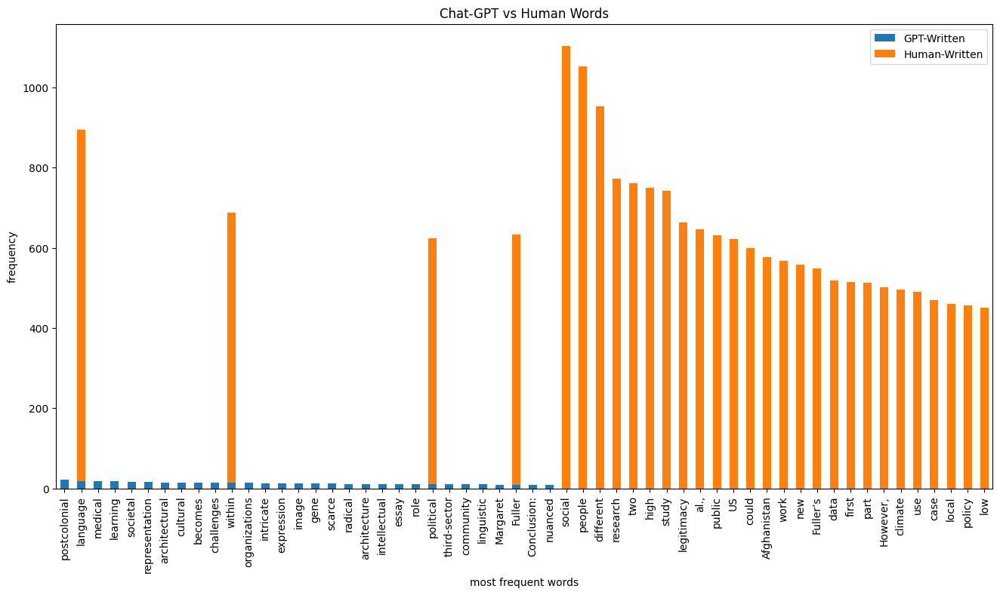

In [40]:
df.plot(kind='bar', stacked=True, figsize=(16, 8)) #Now I plot with my data a comparitive diagramm
plt.title('Chat-GPT vs Human Words')
plt.xlabel('most frequent words')
plt.ylabel('frequency')

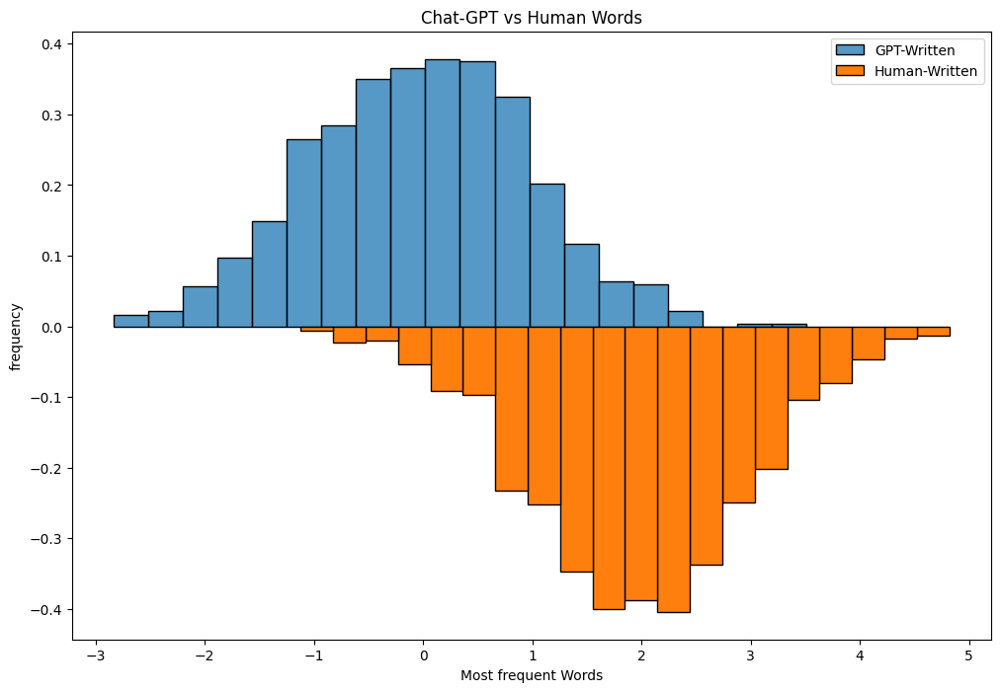

In [41]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-Written': np.random.normal(size=1000),
'Human-Written': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-Written
sns.histplot(x=df['GPT-Written'], stat="density", bins=20, edgecolor='black', label='GPT-Written')

# plot histogram chart for Human Written
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-Written'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-Written')
plt.legend()
# show the graph
plt.show()

As you can see in the table above, the top 30 most frequent words from each document do have a couple of similarities. Because our Chat-GPT data is much shorter I will ignore the word frequency for now. The words which are in both most frequent lists are "language", "within", "political" and "fuller" , which are all related for the documents. Showing that Chat-GPT managed, to some extend well to adapt its language.  

Next I will try to extend the analysis and translate each pdf into txt files as I generated in the first steps. 

In [42]:
path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays_PDF"
def load_all_text_files_in_folder(path):
    corpus = ''
    # Find all files in the folder or subfolders
    for root, _, files in os.walk(path):
        for i, file in enumerate(files):
            # If the file is a pdf file till here it was from week 5
            if file.endswith(".pdf"):
                #reading the text from each pdf 
                fpath = os.path.join(root,file)
                with open(fpath, "rb") as f: #(I used pfdtotext as described in URL above)
                    pdf_files = pdftotext.PDF(f)
                    pdf_file_text = ''
                    # Iterate over all the pages
                    for page in pdf_files:
                        pdf_file_text += page
                        # Add paragraph between the different documents
                        pdf_file_text += '\n\n'
                        print(page)
                    new_file_path = fpath.replace('.pdf','.txt')
                    with open(new_file_path, 'w') as nf:
                        nf.write(pdf_file_text)

                        
                    # Read all the text into one string
                    #print("\n\n".join(pdf))
    return corpus
    


    
Chat_GPT = load_all_text_files_in_folder(path)

#Now we save the text file as a new document

# f=open ("Chat_GPT_1", "w")
# f.write(Chat_GPT_1)
# f.close()

# print(Chat_GPT_1) #print first 10 characters 

In [45]:
path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertationsPDF"
def load_all_text_files_in_folder(path):
    corpus = ''
    # Find all files in the folder or subfolders
    for root, _, files in os.walk(path):
        for i, file in enumerate(files):
            # If the file is a pdf file till here it was from week 5
            if file.endswith(".pdf"):
                #reading the text from each pdf 
                fpath = os.path.join(root,file)
                with open(fpath, "rb") as f: #(I used pfdtotext as described in URL above)
                    pdf_files = pdftotext.PDF(f)
                    pdf_file_text = ''
                    # Iterate over all the pages
                    for page in pdf_files:
                        pdf_file_text += page
                        # Add paragraph between the different documents
                        pdf_file_text += '\n\n'
                        print(page)
                    new_file_path = fpath.replace('.pdf','.txt')
                    with open(new_file_path, 'w') as nf:
                        nf.write(pdf_file_text)

                        
                    # Read all the text into one string
                    #print("\n\n".join(pdf))
    return corpus
    


    
Chat_GPT = load_all_text_files_in_folder(path)

#Now we save the text file as a new document

# f=open ("Chat_GPT_1", "w")
# f.write(Chat_GPT_1)
# f.close()

# print(Chat_GPT_1) #print first 10 characters 

First I wanted to modify the code where I filter the text so that I use a loop so that it picks each text file one by one to create a new open list for the filtered words and to use the name of the file for the filtered list, then I could have used only one code to prepare my text forh the most wordcloud function. However, I didn't work it out, which is why below you will find 20 codes to modify each of the essays 10 for the gpt and 10 for the human written ones 


In [47]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 1

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr1_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_1 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_1.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_1[:1000])
print(len(filtered_GPT_1))

['Nr1_ChatGPT', 'TOWARDS', 'AN', 'ECOSYSTEM', 'VIEW', 'LEGITIMACY', 'THIRD', 'SECTOR', 'ORGANISATIONS', 'First', 'things', 'first,', "what's", 'third', 'sector?', 'Essentially,', 'realm', 'non-profit', 'organizations', 'NGOs—entities', 'driven', 'profit', 'motives', 'commitment', 'social,', 'environmental,', 'cultural', 'causes.', 'Now,', "let's", 'tackle', 'idea', 'Legitimacy,', 'context', 'organizations,', 'like', 'stamp', 'approval.', "society's", 'way', 'saying,', '"Yes,', 'matters,', 'recognize', 'accept', 'it."', 'But', 'onesize-fits-all', 'situation.', 'Legitimacy', 'multifaceted', 'concept', 'influenced', 'various', 'factors,', 'looking', 'ecosystem', 'lens', 'adds', 'another', 'layer', 'complexity.', 'An', 'ecosystem', 'view', 'means', 'considering', 'interconnectedness', 'different', 'elements.', 'case', 'third-sector', 'organizations,', 'involves', 'understanding', 'interact', 'government,', 'businesses,', 'communities,', 'environment.', "Let's", 'explore', 'dimensions', 'co

In [49]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 2

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr2_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_2 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_2.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_2[:1000])
print(len(filtered_GPT_2))

['Nr2_ChatGPT', 'Title:', '"Personality', 'Dynamics', 'Protracted', 'Afghanistan', 'War:', 'Presidential', 'Odyssey"', 'Introduction:', 'protracted', 'Afghanistan', 'War', 'stands', 'multifaceted', 'narrative,', 'intricately', 'woven', 'presidencies', 'George', 'Bush,', 'Barack', 'Obama,', 'Donald', 'Trump,', 'Joe', 'Biden.', 'essay', 'delves', 'fascinating', 'interplay', 'presidential', 'personalities', 'decision-making', 'processes', 'shaped', "America's", 'involvement', 'enduring', 'conflict.', 'Bush', 'Era:', 'Symphony', 'Determination', 'Certainty', 'President', 'George', 'Bush,', 'propelled', 'personality', 'marked', 'unwavering', 'determination', 'certainty,', 'orchestrated', 'opening', 'movements', 'Afghanistan', 'War.', 'aftermath', '9/11,', "Bush's", 'resolute', 'confidence', 'righteousness', 'cause', 'translated', 'swift', 'decision', 'invade', 'Afghanistan.', 'initial', 'strategy', 'steeped', 'conviction', 'military', 'intervention', 'means', 'bring', 'justice', 'perpetrato

In [50]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 3

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr3_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_3 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_3.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_3[:1000])
print(len(filtered_GPT_3))

['Nr3_ChatGPT', 'Title:', "'Space", "In-Between'", 'Radical', 'Eco-Parenting:', 'Comprehensive', 'Exploration', 'Introduction:', 'confluence', "'green'", 'parenting', 'climate', 'activism', 'lies', 'dynamic', 'intricate', 'space,', 'often', 'referred', "'space", "in-between'", 'radical', 'eco-parenting.', 'terrain', 'characterized', 'harmonious', 'blend', 'affective,', 'political,', 'generative', 'dimensions,', 'giving', 'rise', 'unique', 'perspective', 'parenting', 'practices', 'context', 'environmental', 'consciousness.', 'Affective', 'Dimension:', 'At', 'heart', 'radical', 'eco-parenting', 'profound', 'emotional', 'connection', 'environment,', 'surpassing', 'superficial', 'desire', 'greener', 'lifestyle.', 'Parents', 'space', 'experience', 'deep', 'sense', 'interconnectedness', 'natural', 'world,', 'driven', 'heightened', 'awareness', 'implications', 'climate', 'change', 'future', 'well-being', 'children.', 'affective', 'dimension', 'transforms', 'eco-parenting', 'deeply', 'personal

In [51]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 4

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr4_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_4 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_4.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_4[:1000])
print(len(filtered_GPT_4))

['Nr4_ChatGPT', 'Title:', 'Harvesting', 'Humanity:', 'Navigating', 'Refugee', 'Conflict', 'German', 'Community', 'Garden', 'Introduction:', 'Germany,', 'nation', 'seen', 'triumphs', 'tribulations', 'history,', 'become', 'focal', 'point', 'contemporary', 'discourse', 'migration', 'refuge.', 'Against', 'backdrop,', 'community', 'gardens', 'emerged', 'unique', 'spaces', 'cultivate', 'fruits', 'vegetables', 'foster', 'sense', 'inclusion', 'cosmopolitanism.', 'essay', 'explores', 'moral', 'geographies', 'inherent', '"refugees', 'welcome"', 'community', 'garden,', 'cultivation', 'chilli', 'cress', 'becomes', 'intertwined', 'cultivation', 'compassion', 'understanding.', 'Historical', 'Context', 'Migration', 'Germany:', 'To', 'understand', 'contemporary', 'refugee', 'conflict,', 'essential', 'examine', "Germany's", 'historical', 'relationship', 'migration.', 'aftermath', 'World', 'War', 'II', 'fall', 'Berlin', 'Wall,', 'Germany', 'undergone', 'significant', 'demographic', 'shifts.', 'historica

In [52]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 5

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr5_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_5 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_5.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_5[:1000])
print(len(filtered_GPT_5))

['Nr5_ChatGPT', 'Representation', 'Learning', 'Generalisation', 'Medical', 'Image', 'Analysis', 'Introduction:', 'realm', 'healthcare', 'witnessed', 'transformative', 'revolution', 'integration', 'medical', 'imaging', 'technologies.', 'These', 'technologies,', 'ranging', 'X-rays', 'MRIs', 'CT', 'scans,', 'become', 'indispensable', 'tools', 'clinicians', 'diagnostic', 'treatment', 'endeavors.', 'However,', 'sheer', 'volume', 'complexity', 'medical', 'image', 'data', 'pose', 'significant', 'challenges', 'traditional', 'manual', 'analysis.', 'demand', 'efficient', 'accurate', 'diagnostics', 'grows,', 'role', 'automated', 'methods,', 'particularly', 'machine', 'learning,', 'becomes', 'increasingly', 'pronounced.', 'landscape,', 'concept', 'generalization', 'stands', 'linchpin', 'ensuring', 'efficacy', 'machine', 'learning', 'models', 'across', 'diverse', 'unforeseen', 'medical', 'scenarios.', 'essay', 'explores', 'crucial', 'role', 'representation', 'learning', 'achieving', 'robust', 'gene

In [53]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 6

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr6 Chat GPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_6 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_6.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_6[:1000])
print(len(filtered_GPT_6))

['Nr6', 'Chat', 'GPT', 'Title:', 'Intervention,', 'Participation,', 'Perception:', 'Case', 'Studies', 'Language', 'Activism', 'Catalonia,', 'Norway', 'Scotland', 'Introduction:', 'Language', 'activism,', 'potent', 'force', 'preserving', 'cultural', 'identity,', 'plays', 'crucial', 'role', 'shaping', 'socio-political', 'landscape', 'diverse', 'regions.', 'essay', 'explores', 'nuanced', 'dynamics', 'language', 'activism', 'Catalonia,', 'Norway,', 'Scotland,', 'delving', 'interventions,', 'participation,', 'perception', 'key', 'facets', 'multifaceted', 'phenomenon.', 'Language', 'Activism', 'Catalonia:', 'Catalonia,', 'struggle', 'linguistic', 'autonomy', 'deeply', 'rooted', 'history.', 'Catalan', 'language', 'faced', 'suppression', 'various', 'periods,', 'prompting', 'resilient', 'response', 'activists.', 'Government', 'interventions,', 'ranging', 'educational', 'reforms', 'official', 'language', 'recognition,', 'reflect', 'concerted', 'effort', 'revive', 'promote', 'Catalan.', 'At', 'gr

In [54]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 7

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr7_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_7 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_7.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_7[:1000])
print(len(filtered_GPT_7))

['Nr7_Chat', 'GPT', 'Title:', 'Rewriting', 'Life', '“Ultra-Radical”:', 'Margaret', 'Fuller,', 'Ralph', 'Waldo', 'Emerson,', 'Memoirs', 'Margaret', 'Fuller', 'Ossoli', '(1852)', 'Introduction:', 'mid-19th', 'century,', 'wave', 'intellectual', 'social', 'upheaval', 'swept', 'America,', 'challenging', 'conventional', 'norms', 'redefining', 'landscape', 'thought.', 'At', 'forefront', 'movement', 'figures', 'like', 'Margaret', 'Fuller,', '“ultra-radical”', 'thinker,', 'contemporary,', 'Ralph', 'Waldo', 'Emerson.', 'essay', 'delves', 'transformative', 'period', 'life,', 'influence', 'Emerson', 'intellectual', 'journey,', 'portrayal', 'legacy', 'posthumously', 'published', '"Memoirs', 'Margaret', 'Fuller', 'Ossoli"', '(1852).', 'Radical', 'Intellect', 'Margaret', 'Margaret', 'Fuller', 'emerged', 'leading', 'intellectual', 'force,', 'challenging', 'societal', 'norms', 'advocating', 'rights', 'women', 'male-dominated', 'society.', 'Her', 'transcendentalist', 'beliefs,', 'heavily', 'influenced',

In [55]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 8

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr8_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_8 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_8.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_8[:1000])
print(len(filtered_GPT_8))

['Nr8_', 'Chat_GPT:', 'Nationalism', 'Architecture', 'Postcolonial', 'Bangladesh,', '1947-1971', 'Introduction:', 'Unveiling', 'Nexus', 'Nationhood', 'Built', 'Environment', 'aftermath', 'tumultuous', 'events', 'surrounding', 'partition', 'British', 'India', '1947,', 'emergence', 'Bangladesh', 'independent', 'nation', '1971', 'marked', 'critical', 'juncture', 'history', 'South', 'Asia.', 'period,', 'characterized', 'struggle', 'autonomy', 'subsequent', 'liberation', 'Pakistan,', 'witnessed', 'convergence', 'various', 'forces,', 'among', 'nationalism', 'played', 'pivotal', 'role.', 'nascent', 'nation', 'sought', 'define', 'identity', 'assert', 'sovereignty,', 'realm', 'architecture', 'emerged', 'mirror', 'catalyst', 'evolving', 'national', 'consciousness.', 'essay', 'endeavors', 'explore', 'intricate', 'relationship', 'nationalism', 'architecture', 'postcolonial', 'Bangladesh', 'formative', 'years', '1947', '1971.', 'Beyond', 'mere', 'physical', 'structures,', 'architecture', 'context',

In [56]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 9

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr9_ChatGPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_9 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_9.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_9[:1000])
print(len(filtered_GPT_9))

['Chat-GPT:', 'Speciation', 'sex-biased', 'gene', 'expression', 'scarce', 'swallowtails', 'Introduction:', 'world', 'butterflies,', 'kaleidoscope', 'colors', 'intricate', 'patterns,', 'long', 'fascinated', 'scientists', 'nature', 'enthusiasts', 'alike.', 'Among', 'myriad', 'species,', 'scarce', 'swallowtails', '(Iphiclides', 'podalirius)', 'stand', 'distinctive', 'yellow', 'black', 'wings.', 'exploration,', "we'll", 'unravel', 'complex', 'tapestry', 'speciation', 'sex-biased', 'gene', 'expression', 'within', 'realm', 'scarce', 'swallowtails,', 'seeking', 'understand', 'evolutionary', 'forces', 'shaped', 'enchanting', 'creatures.', 'Speciation', 'Scarce', 'Swallowtails:', 'Speciation,', 'process', 'new', 'distinct', 'species', 'arise,', 'often', 'involves', 'gradual', 'accumulation', 'genetic', 'differences', 'populations.', 'For', 'scarce', 'swallowtails,', 'geographical', 'isolation', 'emerges', 'key', 'player', 'intricate', 'dance', 'evolution.', 'Imagine', 'populations', 'separated'

In [57]:
# I define the string, in this case the text file of Chat-GPT Essay Nr 10

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /ChatGPT_Essays/Nr10_Chat_GPT.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_GPT_10 = [] #empty list for filtered words 

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_GPT_10.append(word) 
    
# Print the filtered list of words 
print(filtered_GPT_10[:1000])
print(len(filtered_GPT_10))

['Nr10_', 'Chat-GPT_', '"Journeys', 'Postcolonial', 'City:', 'Re-imagining', 'Spatial', 'Politics', 'Paris', 'Brussels."', 'Introduction', 'urban', 'landscape', 'serves', 'canvas', 'complex', 'interplay', 'social,', 'cultural,', 'political', 'forces.', 'postcolonial', 'city,', 'space', 'marked', 'echoes', 'colonial', 'histories', 'diverse', 'migrations', 'followed,', 'becomes', 'unique', 'stage', 'reimagining', 'spatial', 'politics.', 'essay', 'explores', 'cities', 'Paris', 'Brussels,', 'examining', 'postcolonial', 'narratives', 'unfold', 'journeys', 'inhabitants.', 'By', 'delving', 'lived', 'experiences', 'individuals', 'navigating', 'urban', 'environments,', 'unearth', 'layers', 'spatial', 'politics', 'shape', 'redefine', "cities'", 'identities.', 'Historical', 'Context:', 'Colonial', 'Legacies', 'To', 'comprehend', 'postcolonial', 'dynamics', 'Paris', 'Brussels,', 'essential', 'trace', 'historical', 'threads', 'bind', 'cities', 'colonial', 'pasts.', 'colonial', 'legacy', 'left', 'in

Now on to the Human Written Essays 

In [58]:
# Define string, here the text file of Human Essays Nr1 

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr1_KhakimovaA_BusinessDissertation2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_1 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_1.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_1[:1000])
print(len(filtered_Human_1))

['TOWARDS', 'AN', 'ECOSYSTEM', 'VIEW', 'LEGITIMACY', 'THIRD', 'SECTOR', 'ORGANISATIONS', 'ABSTRACT', 'study', 'aims', 'provide', 'better', 'understanding', 'legitimacy', 'legitimation', 'third', 'sector', 'organisations', '(TSOs).', 'integrating', 'insights', 'contemporary', 'legitimacy', 'literature', 'public', 'administration', 'management', 'literature', 'context', 'Scottish-based', 'TSOs', 'deliver', 'services', 'young', 'people.', 'Legitimacy', 'support', 'resource', 'acquisition', 'long-term', 'survival', 'TSOs.', 'Therefore,', 'legitimacy', 'taken', 'granted', 'must', 'actively', 'managed', 'gain', 'endorsement,', 'support,', 'resources', 'legitimating', 'environment.', 'However,', 'much', 'previous', 'non-profit', 'literature', 'tended', 'focus', 'study', 'dyads,', 'funder', 'often', 'viewed', 'main', 'constituency', 'grants', 'legitimacy', 'TSOs.', 'TSOs', 'complex', 'organisations', 'multiple', 'constituent', 'groups', 'different', 'interests.', 'non-profit', 'underpinnings',

In [59]:
# Define string, here the text file of Human Essays Nr2 

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr2_SunY_2023Dissertation.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_2 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_2.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_2[:1000])
print(len(filtered_Human_2))

['Personality', 'US', 'Presidential', 'Choices:', 'Study', 'Protracted', 'Afghanistan', 'War', 'Abstract', '20-year-long', 'US', 'war', 'Afghanistan,', 'started', '2001', 'ended', '2021,', 'resulted', 'significant', 'civilian', 'casualties,', 'US', 'military', 'deaths', 'financial', 'costs.', 'protracted', 'war', 'raised', 'question', 'war', 'endured', 'long', 'despite', 'terrible', 'costs.', 'order', 'answer', 'question,', 'thesis', 'explores', 'causal', 'relationship', 'personalities', 'leadership', 'styles', 'US', 'presidents', 'George', 'Walker', 'Bush', 'Barack', 'Obama', 'decision-making', 'relating', 'US', 'continuation', 'war.', 'Bush’s', 'Obama’s', 'personalities', 'leadership', 'styles', 'examined', 'using', 'Leadership', 'Trait', 'Analysis', '(LTA).', 'Further', 'personality-based', 'expectations', 'relating', 'two', 'presidents’', 'policy', 'orientations', 'decision-making', 'developed', 'based', 'scores', 'seven', 'LTA', 'traits.', 'These', 'expectations', 'examined', 'two

In [60]:
# Define string, here the text file of Human Essays Nr3 

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr3_HowardLK_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_3 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_3.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_3[:1000])
print(len(filtered_Human_3))

['Where', '‘green’', 'parenting', 'meets', 'climate', 'activism:', 'Understanding', 'affective,', 'political,', 'generative,', 'challenging', '‘space', 'in-between’', 'radical', 'eco-parenting', '1', 'Abstract', 'failure', 'governments', 'tackle', 'climate', 'ecological', 'crisis', 'challenges', 'normative', 'responsibilities', 'parents', 'protect', 'provide', 'children’s', 'future.', 'Recently', 'emerged', 'parent-led', 'climate', 'action', 'groups', 'demonstrated', 'concerns', 'imperilled', 'future', 'put', 'concerns', 'work', 'political', 'action.', 'takes', 'form', 'demanding', 'change', 'organised', 'actions', 'expressing', 'ecological', 'awareness', 'everyday', 'ways', 'living', 'relating.', 'repertoire', 'radical', 'parenting', 'practices', 'future', 'enfolds', 'notions', 'care', 'justice', 'distant', 'others', 'well', 'children,', 'contrasting', 'theories', 'family', 'life', 'parochial', 'politically', 'conservative.', 'Yet,', 'received', 'little', 'attention', 'family', 'clima

In [61]:
# Define string, here the text file of Human Essays Nr4

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr4_PaulusS_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_4 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_4.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_4[:1000])
print(len(filtered_Human_4))

['Chilli,', 'cress', 'cosmopolitanism:', 'moral', 'geographies', '“refugees', 'welcome”', 'community', 'garden', 'Germany', '1.', 'Introduction', 'last', "year's", 'Global', 'Trends', 'report,', 'UNHCR', 'predicted', '"the', 'question', 'longer', 'forced', 'displacement', 'exceed', '100', 'million', 'people', '–', 'rather', 'when".', 'now.', 'With', 'millions', 'Ukrainians', 'displaced', 'displacement', 'elsewhere', '2022,', 'total', 'forced', 'displacement', 'exceeds', '100', 'million', 'people.', 'means', '1', 'every', '78', 'people', 'earth', 'forced', 'flee', '–', 'dramatic', 'milestone', 'expected', 'decade', 'ago', '(United', 'Nations', 'High', 'Commissioner', 'Refugees', '[UNHCR],', '2022,', 'emphasis', 'original).', 'Over', '100', 'million', 'people', 'worldwide', 'forced', 'migrate', 'due', 'conflict,', 'war,', 'persecution,', 'violence,', 'poverty', 'natural', 'disaster', '2022.', 'Continuing', 'worrying', 'upward', 'trend,', 'doubles', '42.7', 'million', 'displaced', 'people

In [62]:
# Define string, here the text file of Human Essays Nr5

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr5_LiuX_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_5 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_5.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_5[:1000])
print(len(filtered_Human_5))

['Representation', 'Learning', 'Generalisation', 'Medical', 'Image', 'Analysis', 'Abstract', 'To', 'help', 'diagnose,', 'treat,', 'manage,', 'prevent', 'predict', 'diseases,', 'medical', 'image', 'analysis', 'plays', 'increasingly', 'crucial', 'role', 'modern', 'health', 'care.', 'particular,', 'using', 'machine', 'learning', '(ML)', 'deep', 'learning', '(DL)', 'techniques', 'process', 'medical', 'imaging', 'data', 'MRI,', 'CT', 'X-Rays', 'scans', 'research', 'hot', 'topic.', 'Accurate', 'generalisable', 'medical', 'image', 'segmentation', 'using', 'ML', 'DL', 'challenging', 'medical', 'image', 'analysis', 'tasks.', 'challenges', 'mainly', 'caused', 'two', 'key', 'reasons:', 'a)', 'variations', 'data', 'statistics', 'across', 'different', 'clinical', 'centres', 'hospitals,', 'b)', 'lack', 'extensive', 'annotations', 'medical', 'data.', 'To', 'tackle', 'challenges,', 'best', 'ways', 'learn', 'disentangled', 'representations.', 'Learning', 'disentangled', 'representations', 'aims', 'sepa

In [63]:
# Define string, here the text file of Human Essays Nr6

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr6_PuchowskiJK_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_6 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_6.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_6[:1000])
print(len(filtered_Human_6))

['Intervention', 'participation', 'perception', 'Case', 'studies', 'language', 'activism', 'Catalonia,', 'Norway', 'Scotland', 'iii', '1.', 'Introduction', '1.1.', 'Background', 'Just', 'checked', 'in.', 'Apartment', 'central', 'Oslo', 'two', 'events', 'attending', 'scheduled', 'take', 'place.', 'anxieties', 'going', 'head—it’s', 'clear', 'many', 'turn', 'tomorrow,', 'wonder', 'know/am', 'friends', 'with.', '[…]', 'I’ve', 'optimistically', 'printed', '20', 'consent', 'forms,', 'doubt', 'I’ll', 'get', 'anything', 'greater', '5.', 'Let’s', 'see.', 'Tomorrow', 'full', 'day', '9:30', 'late.', 'try', 'eat', 'something', 'filling', 'get', 'early', 'night.', '19:17', '2', 'What', 'hands—or', 'likely', 'screen', 'front', 'you—is', 'little', 'different', 'thesis', 'mind', 'submitted', 'proposal', '2018,', 'pandemic-related', 'reasons', 'obvious,', 'reasons', 'later', 'explain.', 'slightly', 'tatty', 'notebook', 'field', 'jottings,', 'bound', 'heft', 'transcriptions', 'subsequent', 'translations

In [64]:
# Define string, here the text file of Human Essays Nr7

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr7_de GalzainA_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_7 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_7.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_7[:1000])
print(len(filtered_Human_7))

['Rewriting', 'Life', '“Ultra-Radical”:', 'Margaret', 'Fuller,', 'Ralph', 'Waldo', 'Emerson,', 'Memoirs', 'Margaret', 'Fuller', 'Ossoli', '(1852)', 'Introduction', '1845', 'Margaret', 'Fuller', 'confidently', 'prophesized', '“no', 'doubt,', 'new', 'manifestation', 'hand,', 'new', 'hour', 'day', 'man”', '(WNC', '10).', 'Inspired', 'wave', 'utopian', 'reform', 'movements', 'sweeping', 'United', 'States', 'Europe,', 'Fuller', 'believed', 'political', 'change', 'imminent', 'America.', 'Right', 'initial', 'pages', 'famous', 'feminist', 'tract', 'Woman', 'Nineteenth', 'Century,', 'insisted', 'need', 'reform', 'young', 'democracy—“The', 'tree,”', 'Fuller', 'metaphorically', 'explained,', '“cannot', 'come', 'flower', 'till', 'root', 'free', 'cankering', 'worm,', 'whole', 'growth', 'open', 'air', 'light”', '(WNC', '10).', 'Fuller', 'denounced', 'fact', 'American', 'nation', 'built', 'structural', 'inequality', 'emphasised', '“[w]hile', 'base,', 'none', 'entirely', 'free', 'noble”', '(WNC', '10)

In [65]:
# Define string, here the text file of Human Essays Nr8

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr8_RezaMT_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_8 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_8.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_8[:1000])
print(len(filtered_Human_8))

['Nationalism', 'Architecture', 'Postcolonial', 'Bangladesh,', '1947-1971', 'List', 'Abbreviation', 'AA', '–', 'Architectural', 'Association', 'AU', '–', 'Agricultural', 'University', 'BCSIR', '–', 'Bangladesh', 'Council', 'Scientific', 'Industrial', 'Research', 'Laboratories', 'BUET', '–', 'Bangladesh', 'University', 'Engineering', 'Technology', 'C&B', '–', 'Communications', 'Building', 'Department', 'DA', '–', 'Doxiadis', 'Associates', 'EPUET', '–', 'East', 'Pakistan', 'University', 'Engineering', 'Technology', 'HAG', '–', 'Harvard', 'Advisory', 'Group', 'IAB', '–', 'Institute', 'Architects', 'Bangladesh', 'ICA', '–', 'International', 'Co-operative', 'Alliance', 'IIM', '–', 'Indian', 'Institutes', 'Management', 'J.', 'J.', 'School', 'Art', '–', 'Sir', 'Jamsethji', 'Jijibhai', 'School', 'Art', 'METU', '–', 'Middle', 'Eastern', 'Technical', 'University', 'MoMA', '–', 'Museum', 'Modern', 'Art', 'NAP', '–', 'National', 'Awami', 'Party', 'NATO', '–', 'North', 'Atlantic', 'Treaty', 'Organi

In [66]:
# Define string, here the text file of Human Essays Nr9

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr9_EbdonS_2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_9 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_9.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_9[:1000])
print(len(filtered_Human_9))

['Speciation', 'sex-biased', 'gene', 'expression', 'scarce', 'swallowtails', 'Chapter', '1', 'General', 'introduction', '1.1', 'Speciation', 'reproductive', 'isolation,', 'barrier', 'gene', 'flow?', 'Speciation', 'evolution', 'reproductive', 'isolation', 'populations', '(Coyne', 'al.,', '2004).', 'Darwin', '(1859)', '–', '’The', 'Origin', 'Species’', 'postulated', 'time', 'species', 'arise', 'simply', 'consequence', 'adaptation', 'natural', 'selection.', 'Although', 'early', 'thinking', 'speciation', 'grappled', 'fundamental', 'paradox', 'selection', 'leading', 'reductions', 'fitness', '(Coyne', 'al.,', '2004),', 'Dobzhansky', '(1935)', 'highlights', 'incongruence', 'concept', 'discrete', 'species', 'continuous', 'nature', 'evolution', 'proposed', 'Darwin', 'concentrated', 'interest', 'process', 'speciation', 'emerges.', 'Here,', 'Dobzhansky', 'states', '“A', 'causal', 'analysis', 'phenomenon', '[read:', 'formation', 'discrete', 'groups', 'organisms]', 'major', 'tasks', 'biological', '

In [67]:
# Define string, here the text file of Human Essays Nr9

path = "/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data /Human_writtenDissertations/Nr10_Davis-Walker2023.txt" 
f = open(path, "r")   #I used this website to get the open function: https://www.w3schools.com/python/python_file_open.asp

text=f.read()
words = text.split() 
filtered_Human_10 = [] #empty list for the filtered words

# Iterate over the list of words 
for word in words: 
  # If the word is not in the stop word list, add it to the filtered list 
  if word not in stop_words: 
    filtered_Human_10.append(word) 
    
# Print the filtered list of words 
print(filtered_Human_10[:1000])
print(len(filtered_Human_10))

['Journeys', 'Postcolonial', 'City:', 'Re-imagining', 'Spatial', 'Politics', 'Paris', 'Brussels', 'El', 'Introduction:', 'Outlining', 'Focus', 'night', 'glaring', 'sunshine.', 'stand', 'woods', 'look', 'towards', 'house', 'misty', 'blue', 'walls.', 'though', 'recently', 'dead', 'saw', 'house', 'new', 'angle.', 'stood', 'eighty', 'summers.', 'Its', 'timber', 'impregnated,', 'four', 'times', 'joy', 'three', 'times', 'sorrow.', 'When', 'someone', 'lived', 'house', 'dies', 'repainted.', 'dead', 'person', 'paints', 'himself,', 'without', 'brush,', 'inside.', 'always', 'early', 'here,', 'crossroads,', 'irrevocable', 'choices.', 'grateful', 'life,', 'yet', 'miss', 'alternatives.', 'All', 'sketches', 'wish', 'real.', 'motor', 'far', 'water', 'extends', 'horizon', 'summer', 'night.', 'Both', 'joy', 'sorrow', 'swell', 'magnifying', 'glass', 'dew.', 'We', 'actually', 'know', 'it,', 'sense', 'it:', 'life', 'sister', 'vessel', 'plies', 'entirely', 'different', 'route.', 'While', 'sun', 'burns', 'be

Now that I have everthing filtered with the variables filtered_GPT_1-10 and filtered_Human_1-10, I can create with wordcloud, a most frequent word illustration for each of them 

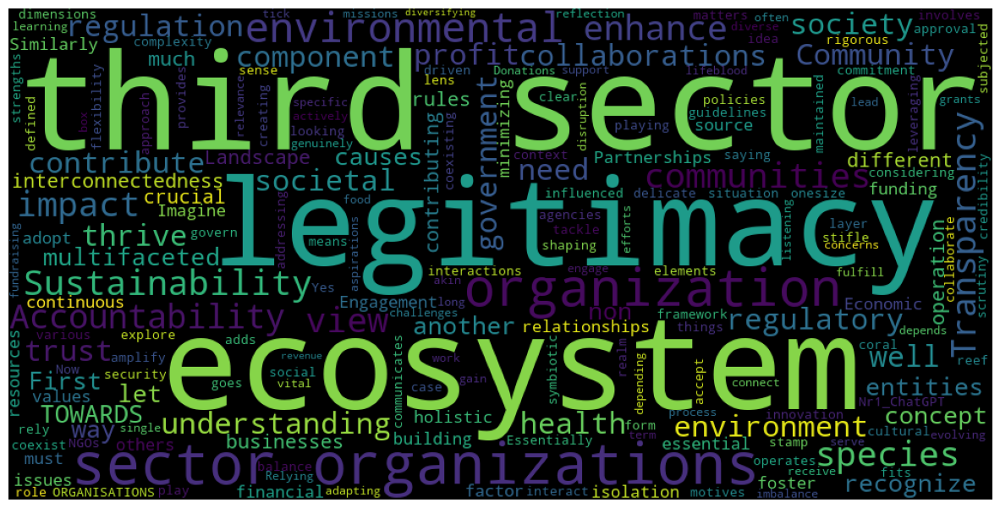

In [68]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_1)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_1"+".png", bbox_inches='tight')
plt.show()
plt.close()

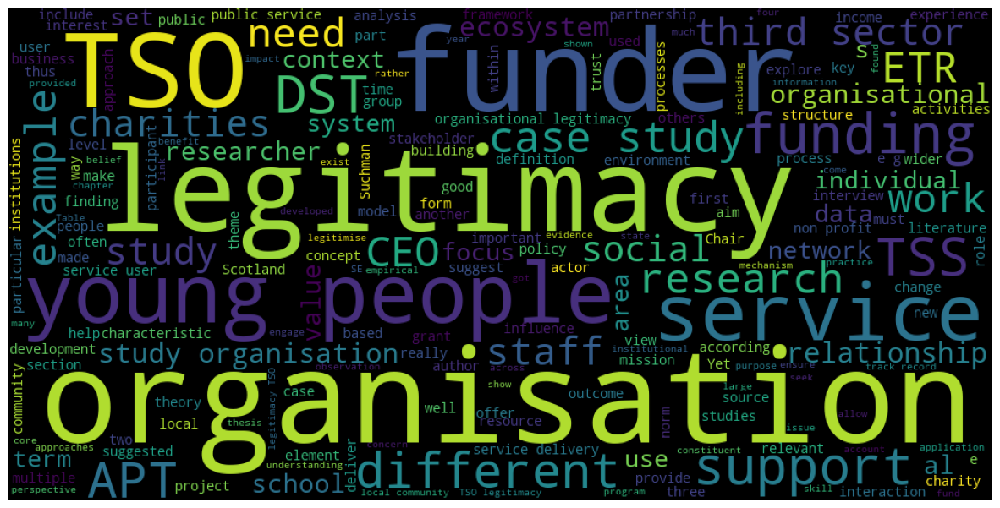

In [69]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_1)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_1"+".png", bbox_inches='tight')
plt.show()
plt.close()

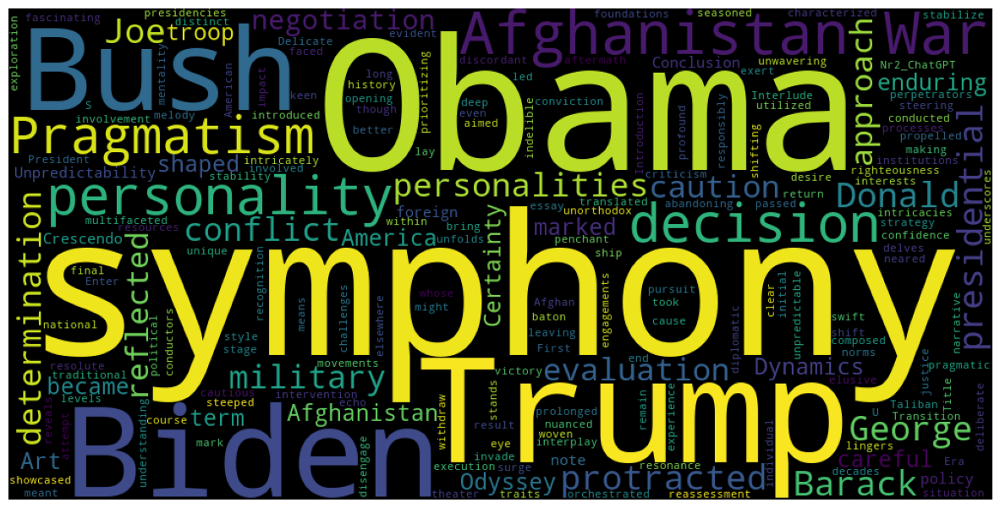

In [70]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_2)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_2"+".png", bbox_inches='tight')
plt.show()
plt.close()

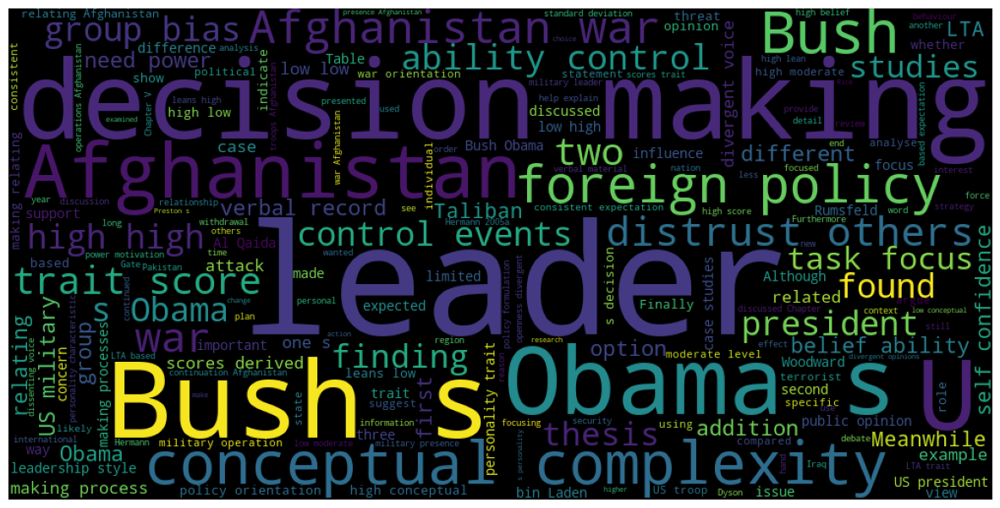

In [71]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_2)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_2"+".png", bbox_inches='tight')
plt.show()
plt.close()

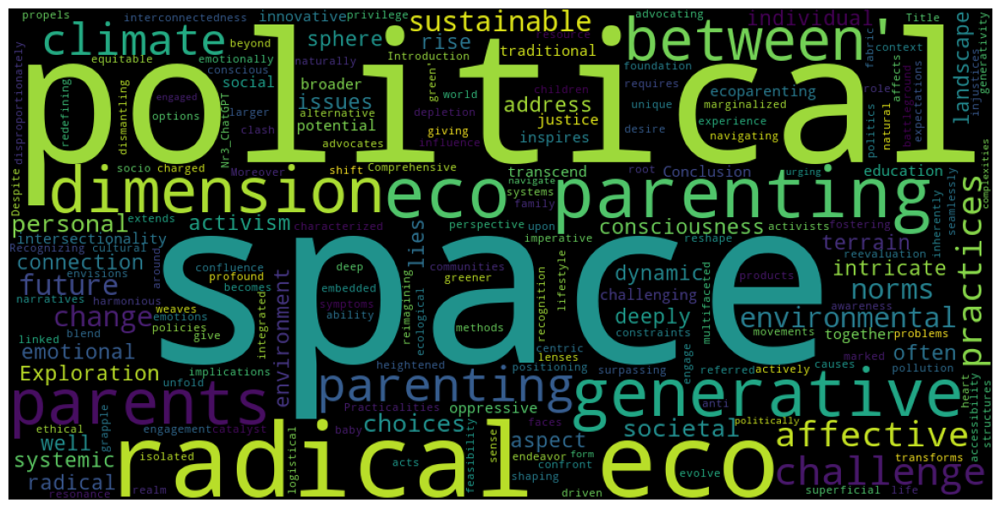

In [72]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_3)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_3"+".png", bbox_inches='tight')
plt.show()
plt.close()

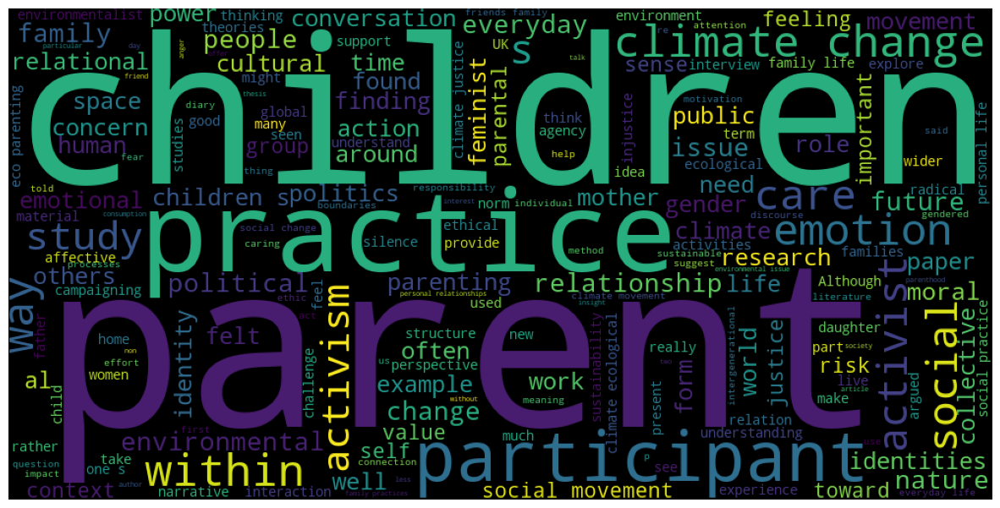

In [73]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_3)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_3"+".png", bbox_inches='tight')
plt.show()
plt.close()

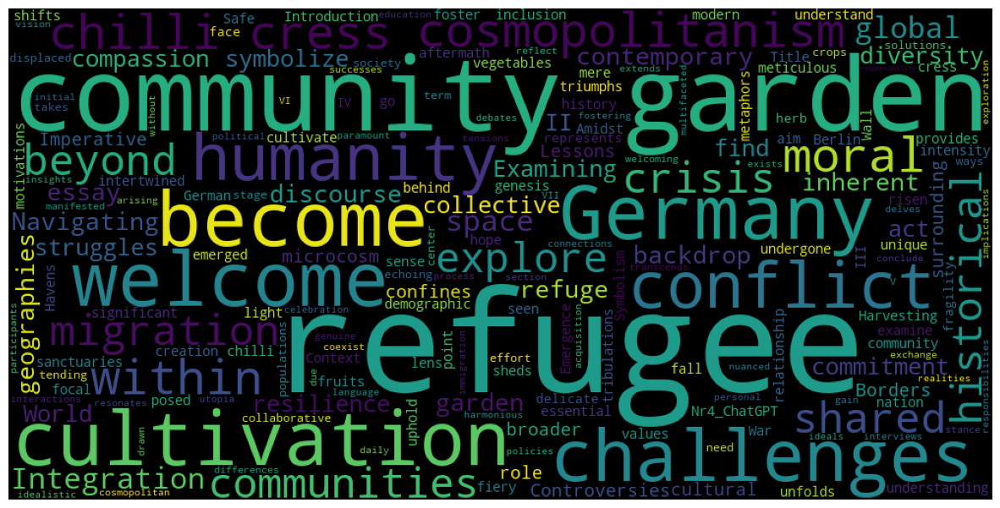

In [74]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_4)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_4"+".png", bbox_inches='tight')
plt.show()
plt.close()

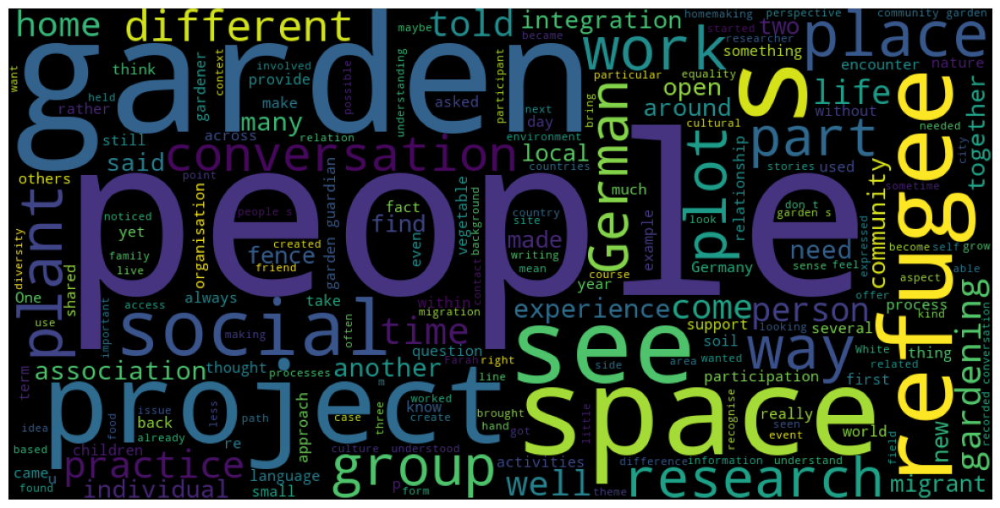

In [75]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_4)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_4"+".png", bbox_inches='tight')
plt.show()
plt.close()

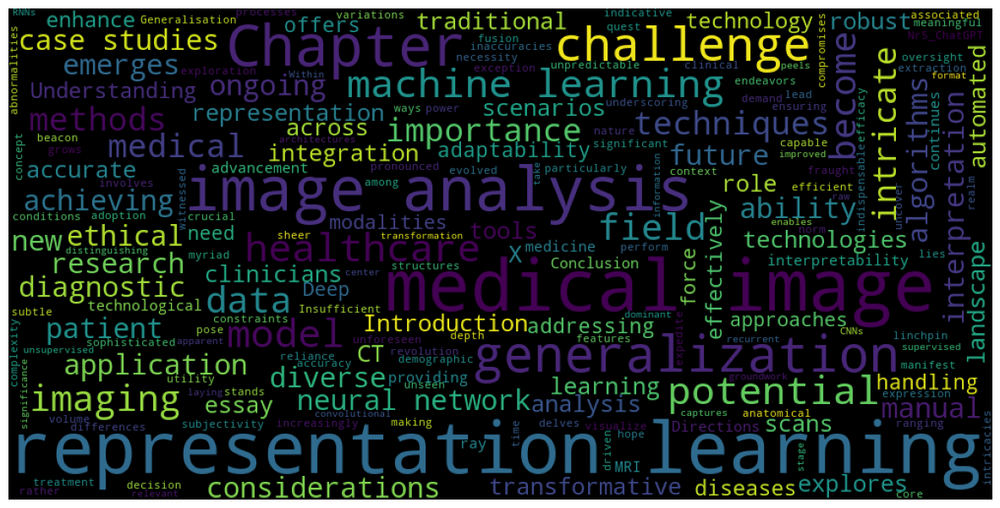

In [76]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_5)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_5"+".png", bbox_inches='tight')
plt.show()
plt.close()

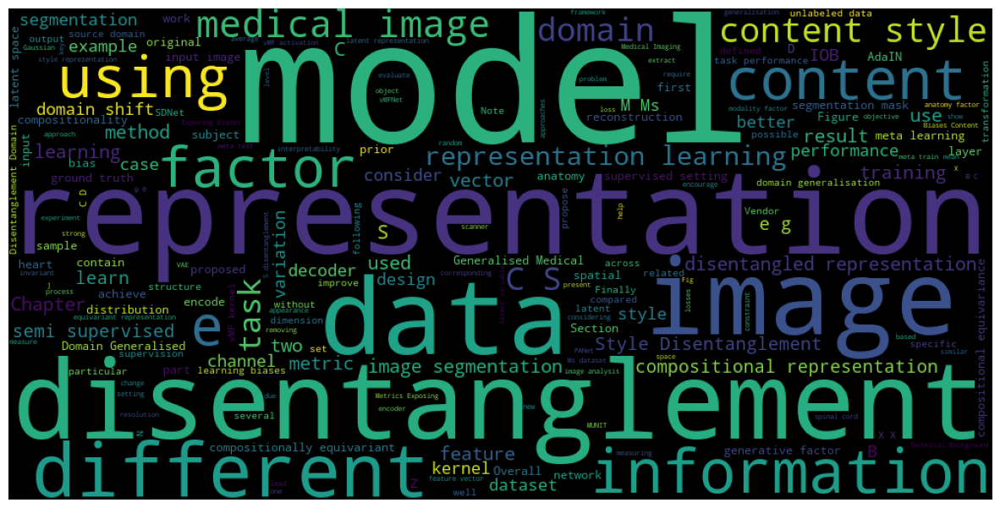

In [77]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_5)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_5"+".png", bbox_inches='tight')
plt.show()
plt.close()

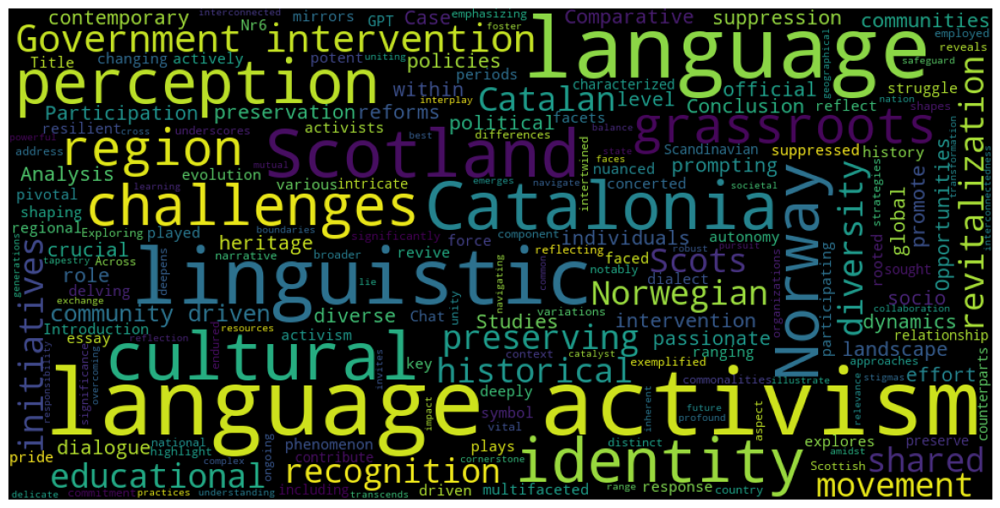

In [78]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_6)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_6"+".png", bbox_inches='tight')
plt.show()
plt.close()

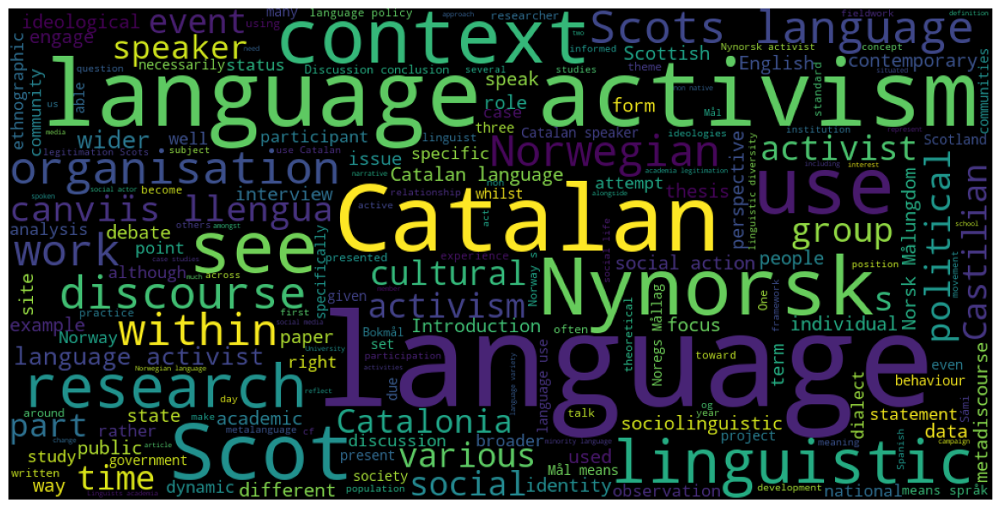

In [79]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_6)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_6"+".png", bbox_inches='tight')
plt.show()
plt.close()

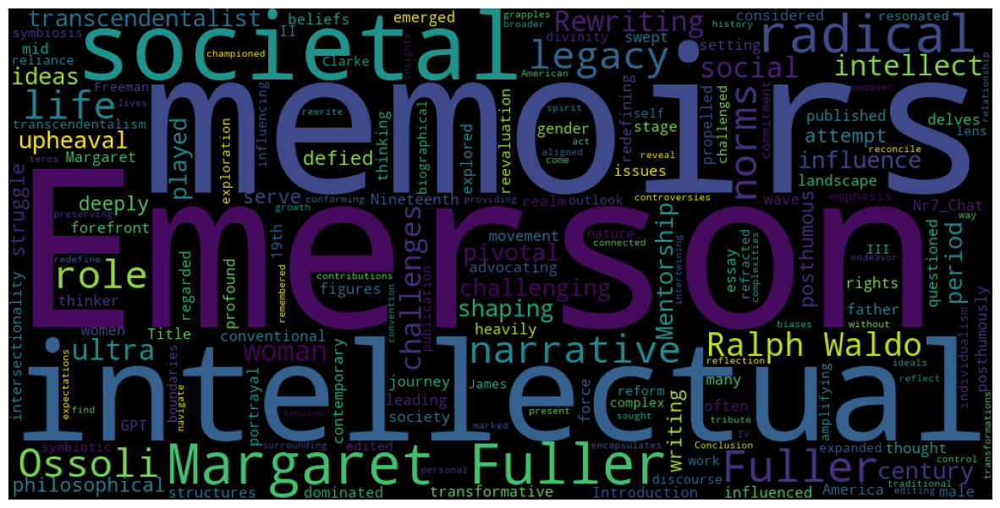

In [80]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_7)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_7"+".png", bbox_inches='tight')
plt.show()
plt.close()

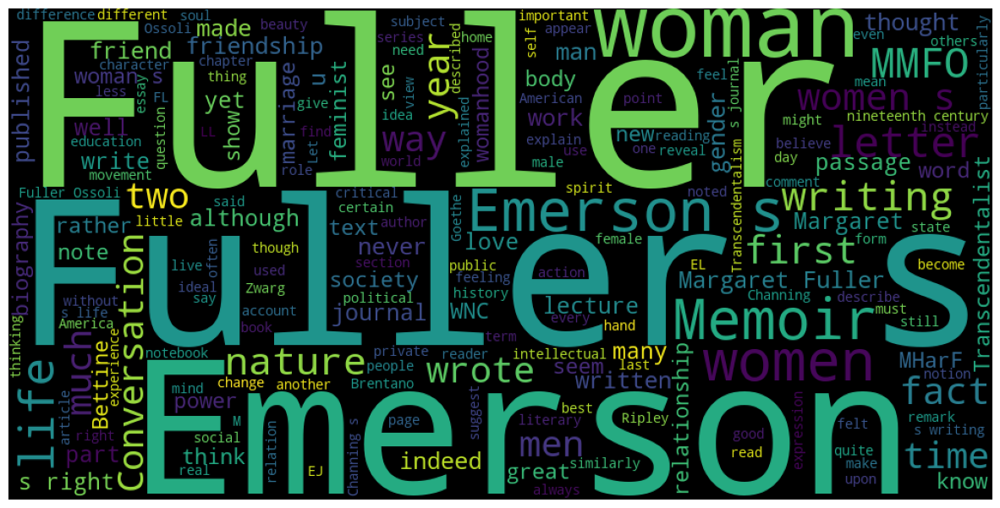

In [81]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_7)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_7"+".png", bbox_inches='tight')
plt.show()
plt.close()

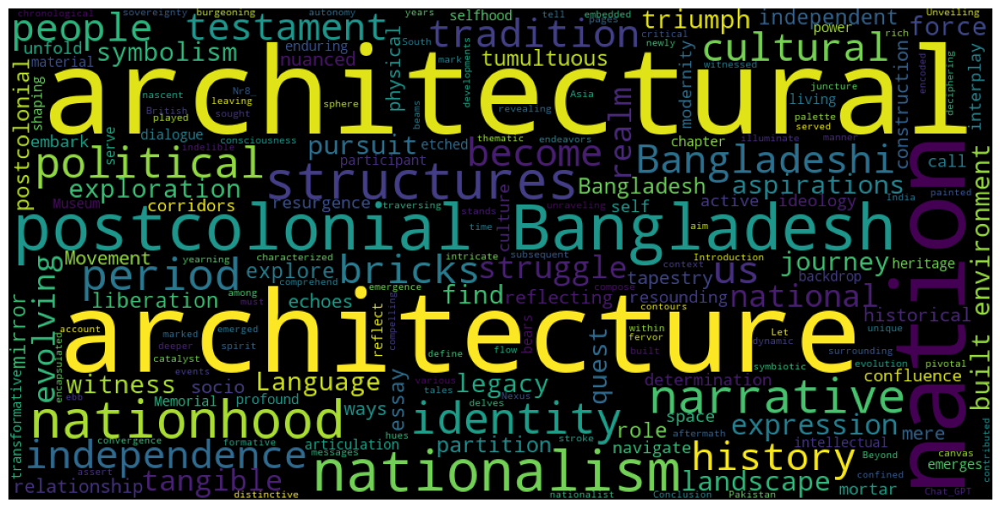

In [82]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_8)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_8"+".png", bbox_inches='tight')
plt.show()
plt.close()

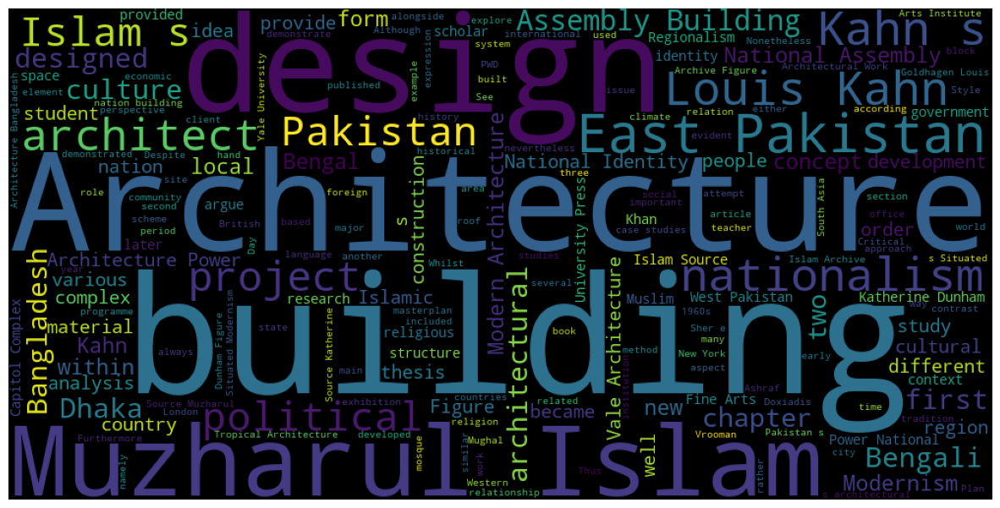

In [83]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_8)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_8"+".png", bbox_inches='tight')
plt.show()
plt.close()

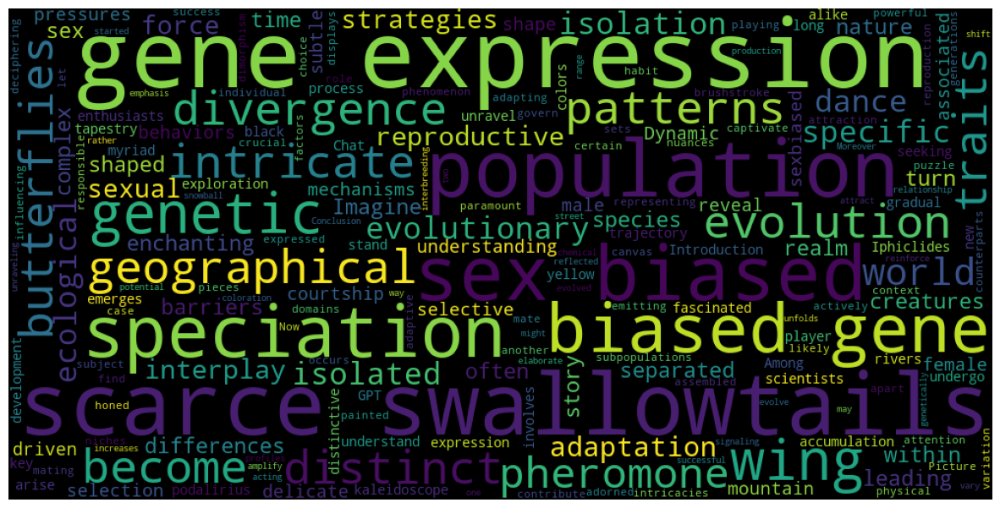

In [84]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_9)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_9"+".png", bbox_inches='tight')
plt.show()
plt.close()

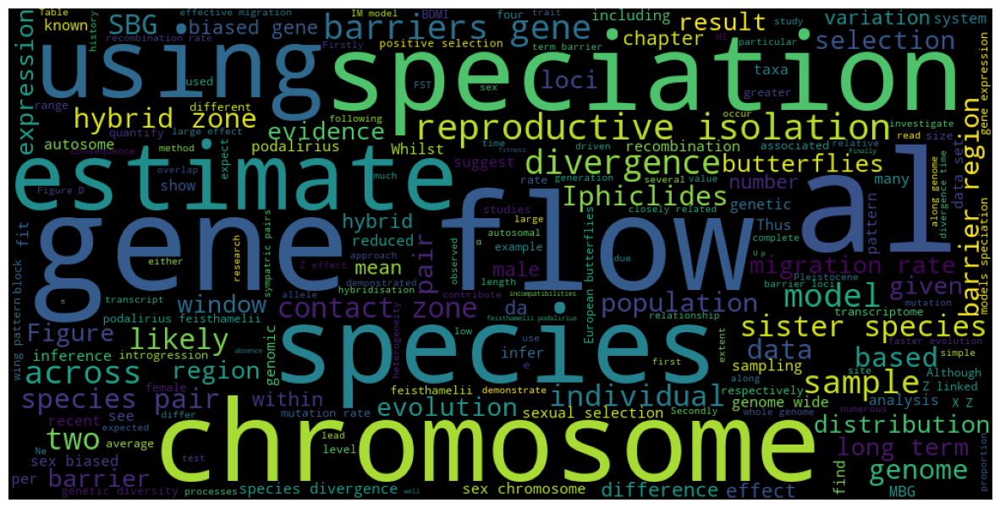

In [85]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_9)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_9"+".png", bbox_inches='tight')
plt.show()
plt.close()

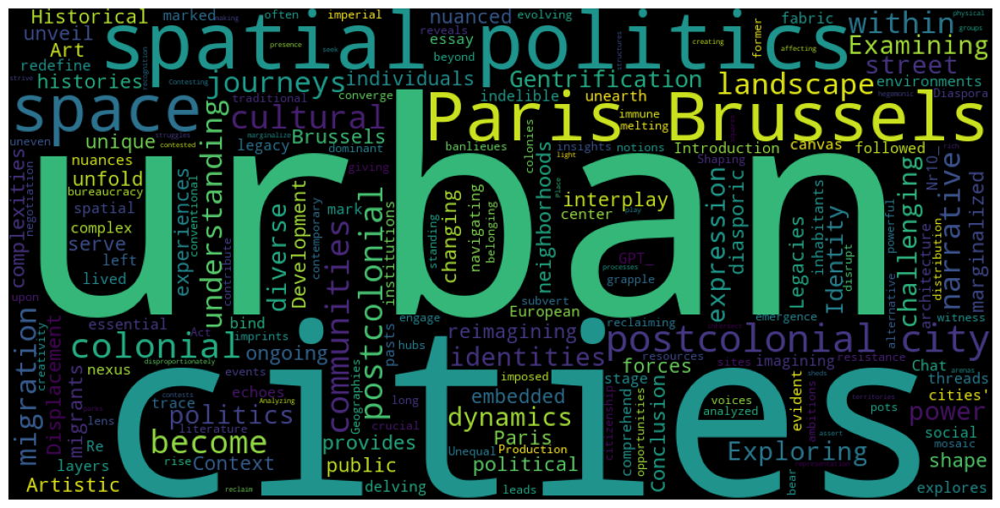

In [86]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_GPT_10)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("GPT_10"+".png", bbox_inches='tight')
plt.show()
plt.close()

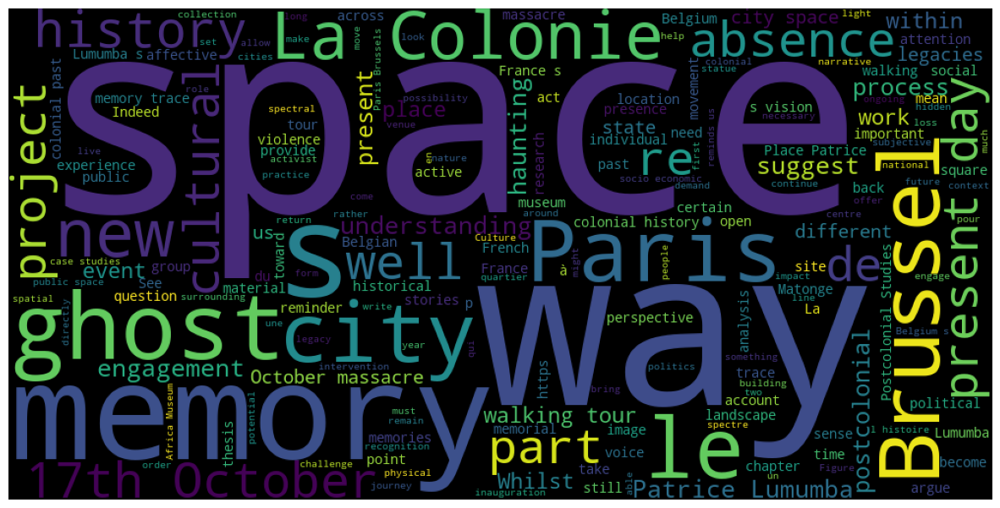

In [87]:
#convert list to string and generate (as above)
unique_string=(" ").join(filtered_Human_10)
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Human_10"+".png", bbox_inches='tight')
plt.show()
plt.close()

In [88]:
GPT_1_overview = Counter(filtered_GPT_1)
GPT_2_overview = Counter(filtered_GPT_2)
GPT_3_overview = Counter(filtered_GPT_3)
GPT_4_overview = Counter(filtered_GPT_4)
GPT_5_overview = Counter(filtered_GPT_5)
GPT_6_overview = Counter(filtered_GPT_6)
GPT_7_overview = Counter(filtered_GPT_7)
GPT_8_overview = Counter(filtered_GPT_8)
GPT_9_overview = Counter(filtered_GPT_9)
GPT_10_overview = Counter(filtered_GPT_10)
GPT_10_overview #I checked each list to see if there are words I have to manually insert into the stopword list 

Counter({'postcolonial': 11,
         'Paris': 9,
         'spatial': 9,
         'urban': 8,
         'cities': 8,
         'politics': 7,
         'colonial': 5,
         'Brussels,': 5,
         'Brussels': 4,
         'within': 4,
         'city,': 3,
         'diverse': 3,
         'politics.': 3,
         'journeys': 3,
         'dynamics': 3,
         'cultural': 3,
         'understanding': 3,
         'city': 3,
         'become': 3,
         'challenging': 3,
         'Politics': 2,
         'landscape': 2,
         'interplay': 2,
         'space': 2,
         'histories': 2,
         'migrations': 2,
         'becomes': 2,
         'unique': 2,
         'reimagining': 2,
         'narratives': 2,
         'unfold': 2,
         'By': 2,
         'experiences': 2,
         'individuals': 2,
         'shape': 2,
         'identities.': 2,
         'Exploring': 2,
         'complexities': 2,
         'Urban': 2,
         'diasporic': 2,
         'Examining': 2,
         'migran

In [89]:
Human_1_overview = Counter(filtered_Human_1)
Human_2_overview = Counter(filtered_Human_2)
Human_3_overview = Counter(filtered_Human_3)
Human_4_overview = Counter(filtered_Human_4)
Human_5_overview = Counter(filtered_Human_5)
Human_6_overview = Counter(filtered_Human_6)
Human_7_overview = Counter(filtered_Human_7)
Human_8_overview = Counter(filtered_Human_8)
Human_9_overview = Counter(filtered_Human_9)
Human_10_overview = Counter(filtered_Human_10)
Human_10_overview #I checked each list to see if there are words I have to manually insert into the stopword list 

Counter({'colonial': 296,
         'memory': 197,
         'La': 155,
         'space': 147,
         'city': 146,
         'history': 143,
         'new': 141,
         '—': 132,
         'us': 127,
         'postcolonial': 125,
         'legacies': 124,
         'October': 122,
         'Paris': 111,
         'walking': 111,
         'traces': 110,
         '17th': 107,
         'ways': 106,
         'public': 103,
         'ghosts': 102,
         'haunting': 100,
         'well': 98,
         'cultural': 97,
         'within': 93,
         'across': 92,
         'By': 92,
         'different': 90,
         'vision': 90,
         'Lumumba': 89,
         'Patrice': 89,
         'part': 88,
         'understanding': 87,
         '17.10.61': 86,
         'social': 85,
         'massacre': 85,
         'process': 84,
         'present': 83,
         'Colonie': 81,
         'des': 78,
         'historical': 77,
         'present-day': 77,
         'Brussels': 75,
         '(accessed': 75,

In [90]:
df_Total = pd.DataFrame({
    'GPT-1': dict(GPT_1_overview.most_common(20)),
    'Human-1': dict(Human_1_overview.most_common(20)),
    'GPT-2': dict(GPT_2_overview.most_common(20)),
    'Human-2': dict(Human_2_overview.most_common(20)),
    'GPT-3': dict(GPT_3_overview.most_common(20)),
    'Human-3': dict(Human_3_overview.most_common(20)),
    'GPT-4': dict(GPT_4_overview.most_common(20)),
    'Human-4': dict(Human_4_overview.most_common(20)),
    'GPT-5': dict(GPT_5_overview.most_common(20)),
    'Human-5': dict(Human_5_overview.most_common(20)),
    'GPT-6': dict(GPT_6_overview.most_common(20)),
    'Human-6': dict(Human_6_overview.most_common(20)),
    'GPT-7': dict(GPT_7_overview.most_common(20)),
    'Human-7': dict(Human_7_overview.most_common(20)),
    'GPT-8': dict(GPT_8_overview.most_common(20)),
    'Human-8': dict(Human_8_overview.most_common(20)),
    'GPT-9': dict(GPT_9_overview.most_common(20)),
    'Human-9': dict(Human_9_overview.most_common(20)),
    'GPT-10': dict(GPT_10_overview.most_common(20)),
    'Human-10': dict(Human_10_overview.most_common(20)),

})

In [91]:
df_Total.to_csv('items.csv', index=False, encoding='utf-8')

In [92]:
df_Total

,GPT-1,Human-1,GPT-2,Human-2,GPT-3,Human-3,GPT-4,Human-4,GPT-5,Human-5,GPT-6,Human-6,GPT-7,Human-7,GPT-8,Human-8,GPT-9,Human-9,GPT-10,Human-10
organizations,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
third-sector,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ecosystem,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
legitimacy,8.0,652.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"organizations,",4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
traces,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,110.0
17th,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0
ways,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,106.0
ghosts,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102.0


In [93]:
df_Total['GPT-1'] = df_Total['GPT-1'].fillna(0)
df_Total['Human-1'] = df_Total['Human-1'].fillna(0)
df_Total['GPT-2'] = df_Total['GPT-2'].fillna(0)
df_Total['Human-2'] = df_Total['Human-2'].fillna(0)
df_Total['GPT-3'] = df_Total['GPT-3'].fillna(0)
df_Total['Human-3'] = df_Total['Human-3'].fillna(0)
df_Total['GPT-4'] = df_Total['GPT-4'].fillna(0)
df_Total['Human-4'] = df_Total['Human-4'].fillna(0)
df_Total['GPT-5'] = df_Total['GPT-5'].fillna(0)
df_Total['Human-5'] = df_Total['Human-5'].fillna(0)
df_Total['GPT-6'] = df_Total['GPT-6'].fillna(0)
df_Total['Human-6'] = df_Total['Human-6'].fillna(0)
df_Total['GPT-7'] = df_Total['GPT-7'].fillna(0)
df_Total['Human-7'] = df_Total['Human-7'].fillna(0)
df_Total['GPT-8'] = df_Total['GPT-8'].fillna(0)
df_Total['Human-8'] = df_Total['Human-8'].fillna(0)
df_Total['GPT-9'] = df_Total['GPT-9'].fillna(0)
df_Total['Human-9'] = df_Total['Human-9'].fillna(0)
df_Total['GPT-10'] = df_Total['GPT-10'].fillna(0)
df_Total['Human-10'] = df_Total['Human-10'].fillna(0)

pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_columns', None)  # Display all columns

#print(df_Total)
df_Total

,GPT-1,Human-1,GPT-2,Human-2,GPT-3,Human-3,GPT-4,Human-4,GPT-5,Human-5,GPT-6,Human-6,GPT-7,Human-7,GPT-8,Human-8,GPT-9,Human-9,GPT-10,Human-10
organizations,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
third-sector,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ecosystem,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
legitimacy,8.0,652.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"organizations,",4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"ecosystem,",4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
species,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,215.0,0.0,0.0
enhance,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
environmental,4.0,0.0,0.0,0.0,4.0,150.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
third,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Text(0, 0.5, 'frequency')

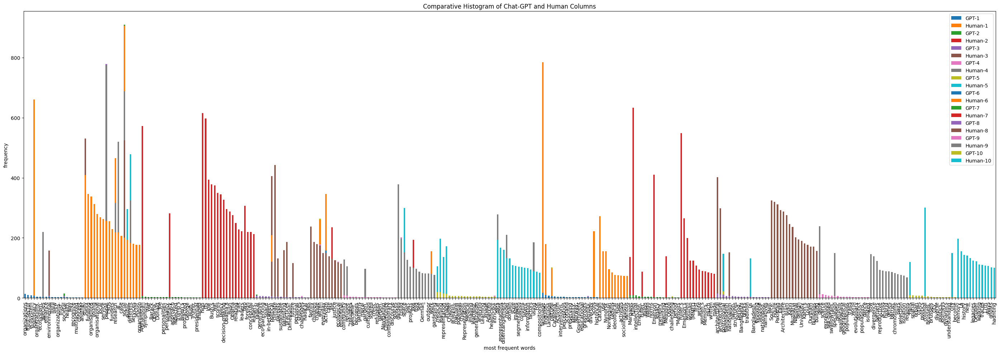

In [106]:

df_Total.plot(kind='bar', stacked=True, figsize=(28, 10)) #Now I plot with my data a comparitive diagramm
plt.rcParams["figure.autolayout"] = True #I found some code online to adjust the x axis, but I mainly adjusted the figsize:https://www.tutorialspoint.com/increasing-the-space-for-x-axis-labels-in-matplotlib 
plt.title('Comparative Histogram of Chat-GPT and Human Columns')
plt.xlabel('most frequent words')
plt.ylabel('frequency')



As you can see, this general plot doens't give me too many insights as it is hard to compare each topic with one another. Which is why I will plot a comparative histogram for each of them 

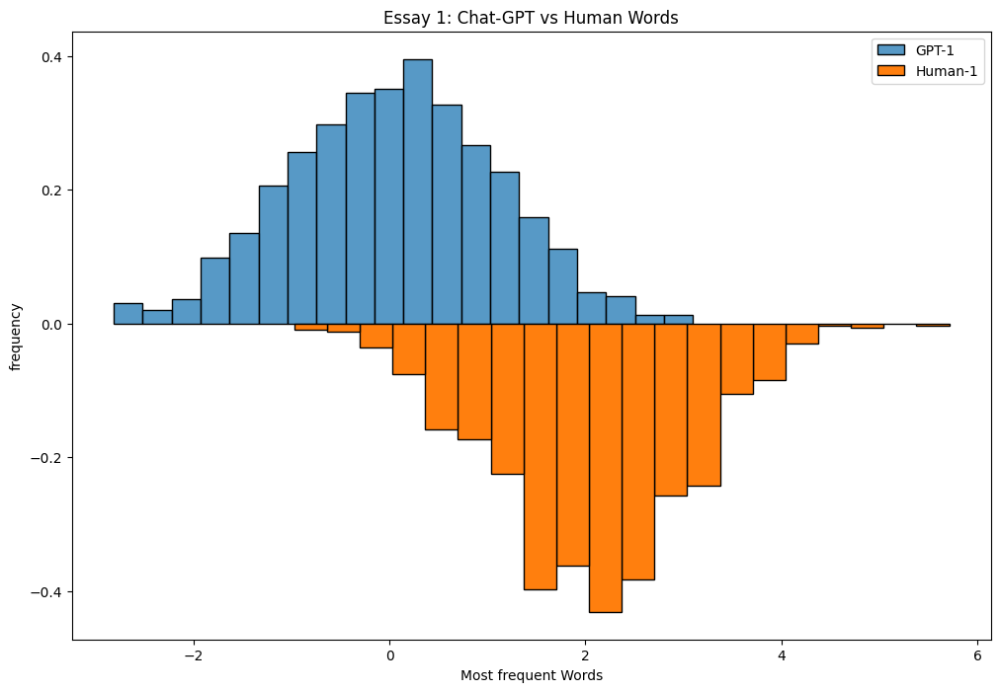

In [322]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-1': np.random.normal(size=1000),
'Human-1': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-1
sns.histplot(x=df['GPT-1'], stat="density", bins=20, edgecolor='black', label='GPT-1')

# plot histogram chart for Human-1
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-1'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 1: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-1')
plt.legend()
# show the graph
plt.show()

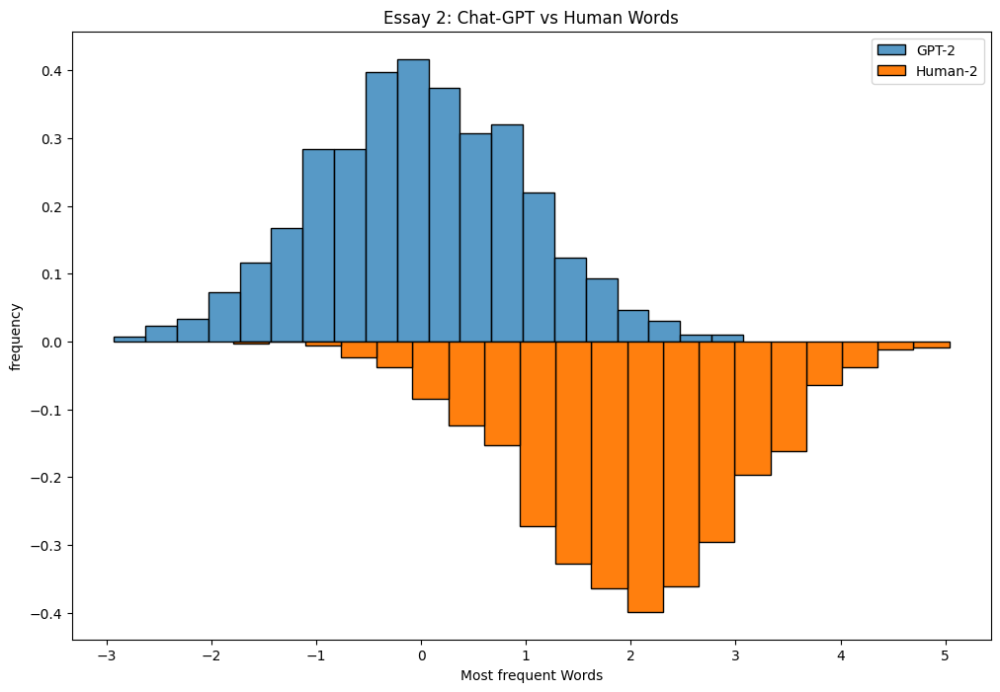

In [323]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-2': np.random.normal(size=1000),
'Human-2': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-2
sns.histplot(x=df['GPT-2'], stat="density", bins=20, edgecolor='black', label='GPT-2')

# plot histogram chart for Human-2
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-2'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 2: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-2')
plt.legend()
# show the graph
plt.show()

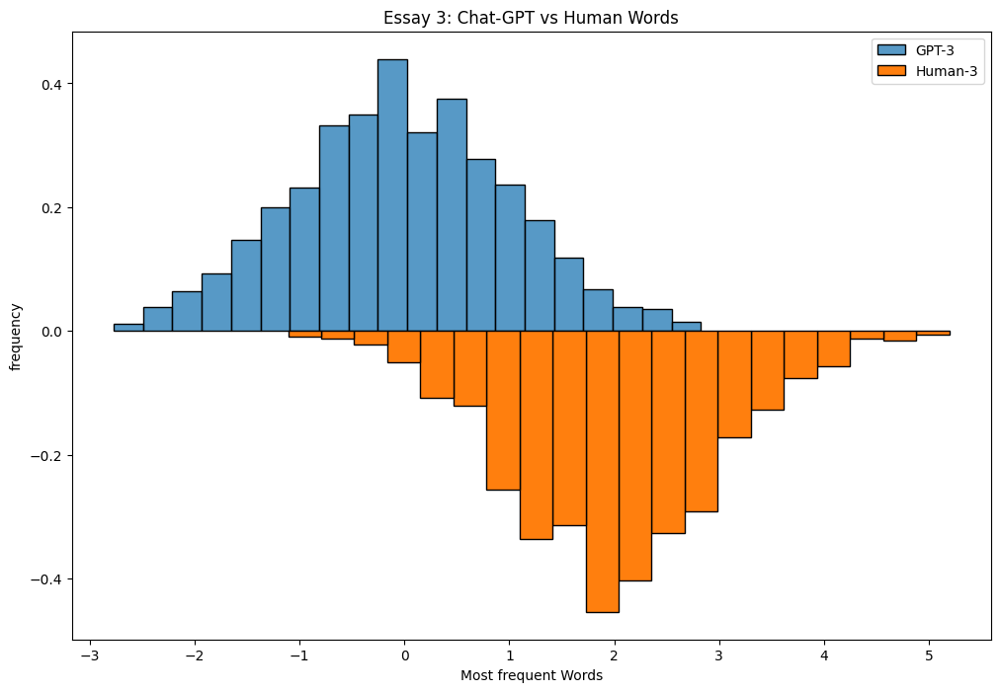

In [324]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-3': np.random.normal(size=1000),
'Human-3': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-3
sns.histplot(x=df['GPT-3'], stat="density", bins=20, edgecolor='black', label='GPT-3')

# plot histogram chart for Human-3
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-3'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 3: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-3')
plt.legend()
# show the graph
plt.show()

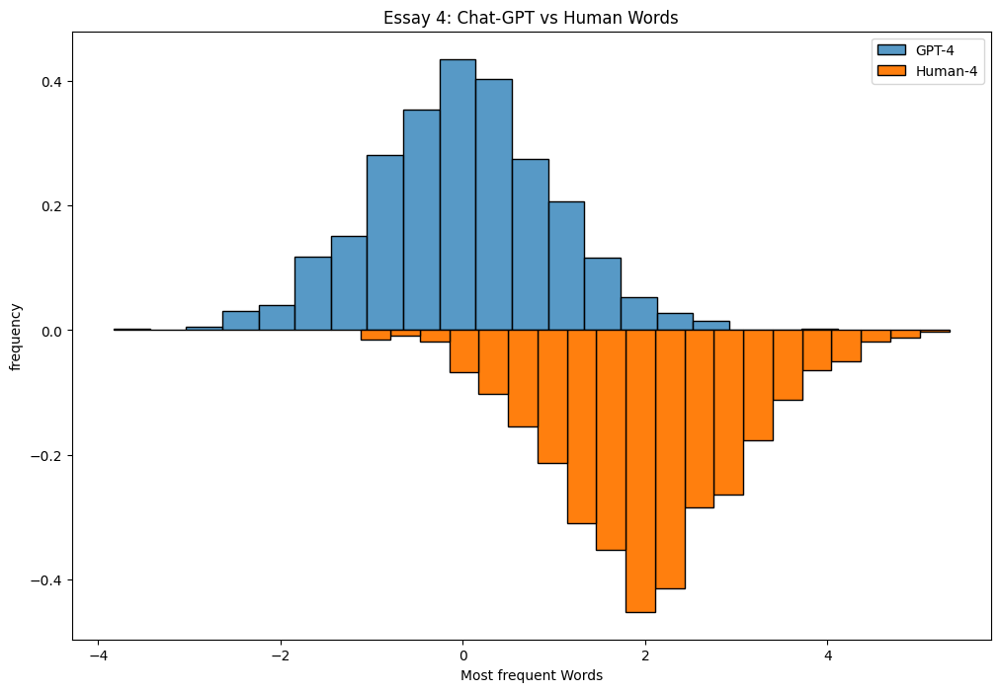

In [325]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-4': np.random.normal(size=1000),
'Human-4': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-4
sns.histplot(x=df['GPT-4'], stat="density", bins=20, edgecolor='black', label='GPT-4')

# plot histogram chart for Human-4
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-4'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 4: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-4')
plt.legend()
# show the graph
plt.show()

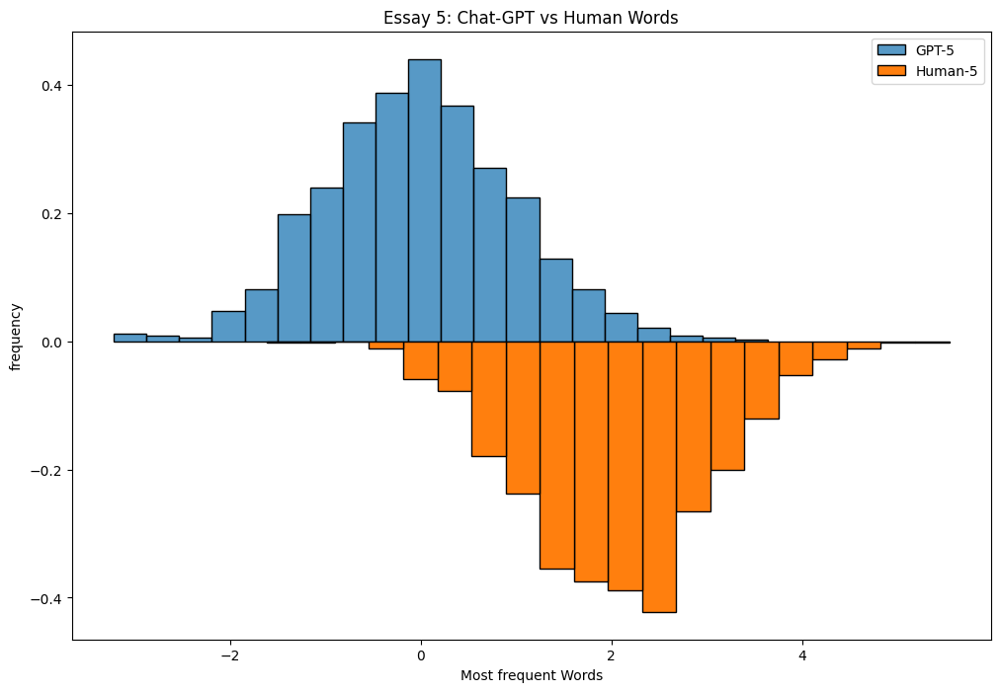

In [327]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-5': np.random.normal(size=1000),
'Human-5': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-5
sns.histplot(x=df['GPT-5'], stat="density", bins=20, edgecolor='black', label='GPT-5')

# plot histogram chart for Human-5
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-5'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 5: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-5')
plt.legend()
# show the graph
plt.show()

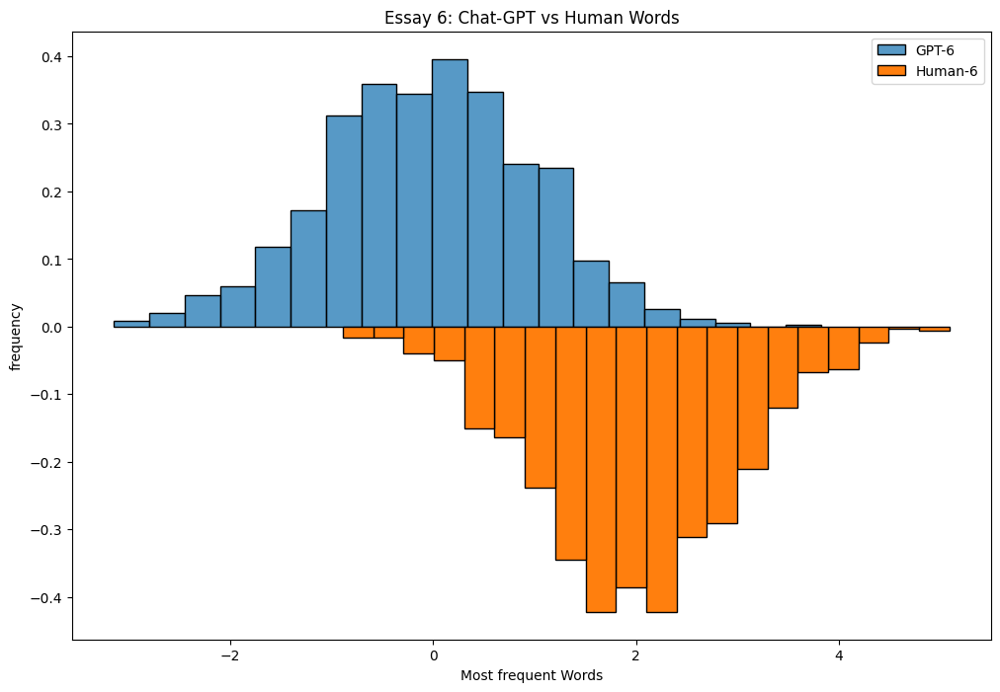

In [328]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-6': np.random.normal(size=1000),
'Human-6': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-6
sns.histplot(x=df['GPT-6'], stat="density", bins=20, edgecolor='black', label='GPT-6')

# plot histogram chart for Human-6
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-6'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 6: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-6')
plt.legend()
# show the graph
plt.show()

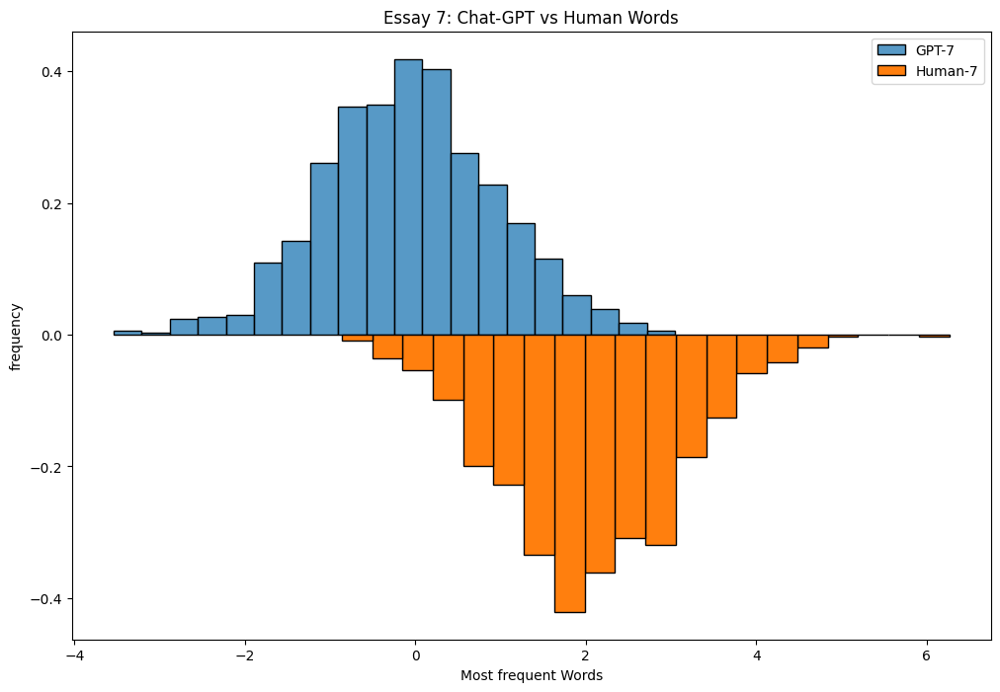

In [329]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-7': np.random.normal(size=1000),
'Human-7': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-7
sns.histplot(x=df['GPT-7'], stat="density", bins=20, edgecolor='black', label='GPT-7')

# plot histogram chart for Human-7
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-7'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 7: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-7')
plt.legend()
# show the graph
plt.show()

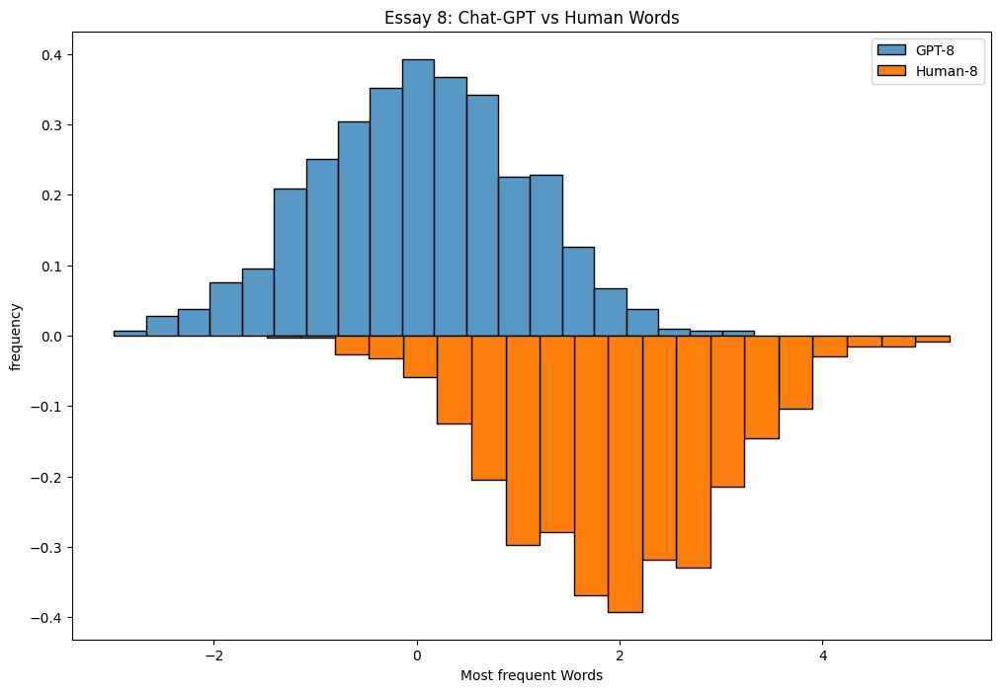

In [330]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-8': np.random.normal(size=1000),
'Human-8': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-8
sns.histplot(x=df['GPT-8'], stat="density", bins=20, edgecolor='black', label='GPT-8')

# plot histogram chart for Human-8
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-8'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 8: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-8')
plt.legend()
# show the graph
plt.show()

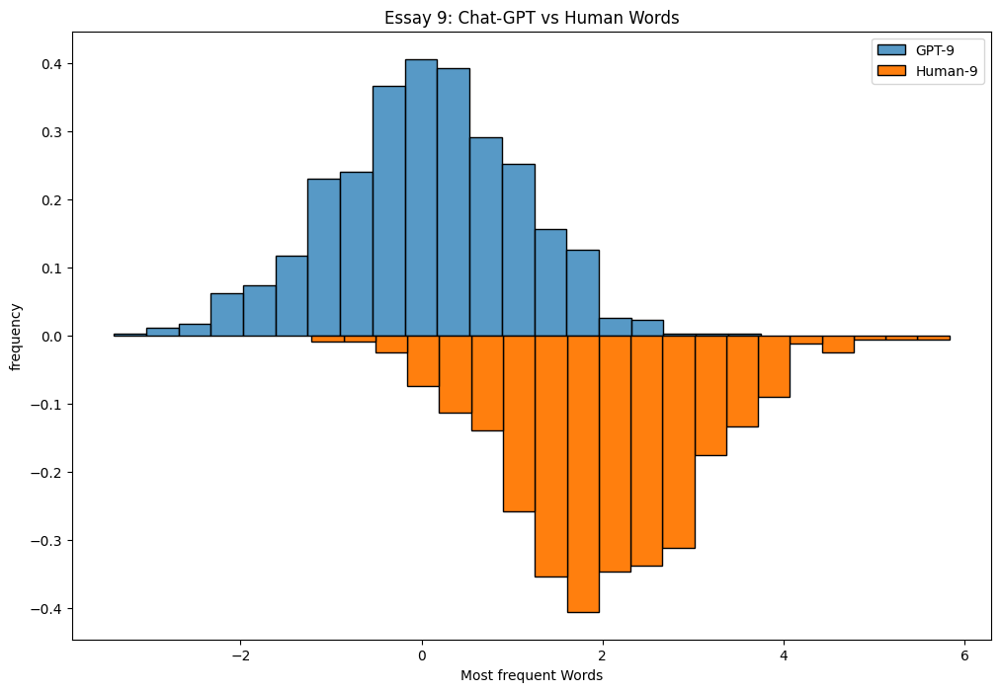

In [331]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-9': np.random.normal(size=1000),
'Human-9': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-9
sns.histplot(x=df['GPT-9'], stat="density", bins=20, edgecolor='black', label='GPT-9')

# plot histogram chart for Human-9
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-9'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 9: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-9')
plt.legend()
# show the graph
plt.show()

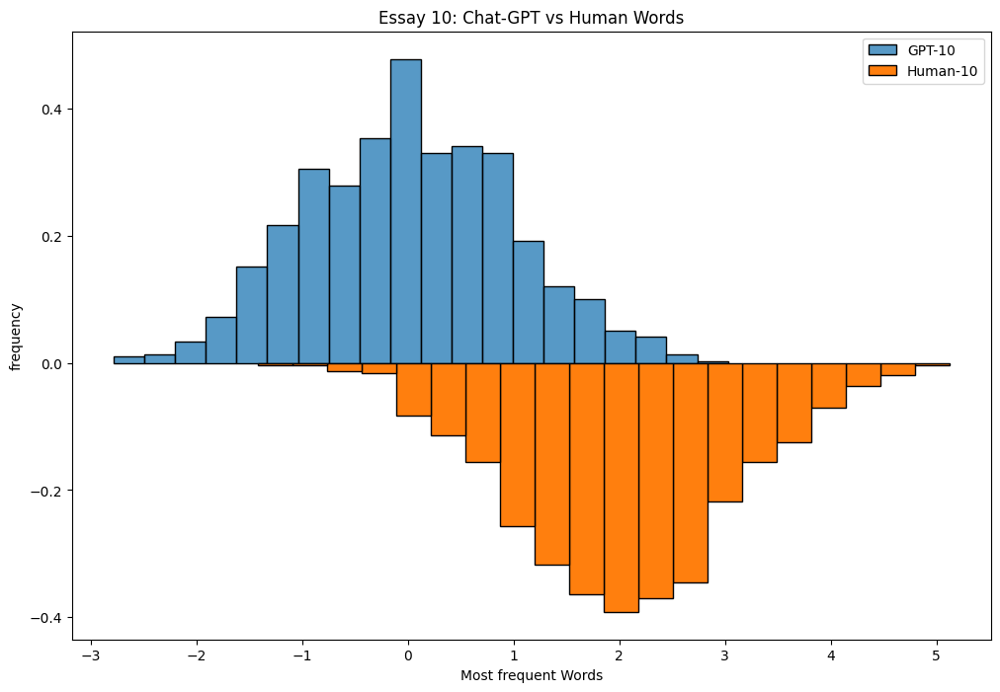

In [332]:
# libraries I found the code here and adjusted it to my code https://python-graph-gallery.com/density-mirror/
import numpy as np
from numpy import linspace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# dataframe
df = pd.DataFrame({
'GPT-10': np.random.normal(size=1000),
'Human-10': np.random.normal(loc=2, size=1000) * -1
})

# Fig size
plt.rcParams["figure.figsize"]=12,8

# plot histogram chart for GPT-10
sns.histplot(x=df['GPT-10'], stat="density", bins=20, edgecolor='black', label='GPT-10')

# plot histogram chart for Human-10
n_bins = 20
# get positions and heights of bars
heights, bins = np.histogram(df['Human-10'], density=True, bins=n_bins) 

# multiply by -1 to reverse it
heights *= -1
bin_width = np.diff(bins)[0]
bin_pos =( bins[:-1] + bin_width / 2) * -1

plt.title('Essay 10: Chat-GPT vs Human Words')
plt.xlabel('Most frequent Words')
plt.ylabel('frequency')
# plot
plt.bar(bin_pos, heights, width=bin_width, edgecolor='black', label='Human-10')
plt.legend()
# show the graph
plt.show()

Now I will try to build a classifier on my data using this source to upload it: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_files.html#:~:text=To%20use%20text%20files%20in,using%20the%20'encoding'%20parameter and the Week 6 classifier lecture plus notebooks. 

In [18]:
#!pip install --upgrade scikit-learn #I encounterd errors as Scikit was unkwon when I used is to I had to force an update

  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/20/0f/51e3ccdc87c25e2e33bf7962249ff8c5ab1d6aed0144fb003348ce8bd352/scikit_learn-1.3.2-cp39-cp39-macosx_12_0_arm64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 7.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.1
    Uninstalling scikit-learn-1.3.1:
      Successfully uninstalled scikit-learn-1.3.1


In [99]:
import nltk
import pandas as pd
# NLTK utils
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Bag of words
from sklearn.feature_extraction.text import CountVectorizer

# Classification stuff
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import load_files
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation



In [72]:
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/jillcakmak/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/jillcakmak/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [73]:
# Function originally from: https://www.programcreek.com/python/?CodeExample=get%20wordnet%20pos
def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [74]:
#the base of this code is the one from scikit learn mentioned above, I left all the parameters out which would be NONE
from sklearn.datasets import load_files

data = load_files('/Users/jillcakmak/Documents/GitHub/NLP_Project/My Data ', encoding='utf-8', shuffle= True, allowed_extensions=['.txt'])
#I had an error message at first because I put allowed_extensions='.txt' without the [] brackets, I asked Chat-GPT and it told me that I need to define it as a list


Now as we did in Week 6 I want to modify my data to be displayed in a pandas table, I will use the code from above I learned in my tutorial, my goal is that it automatically only takes the text documents(as defined above) and that I only have to insert the folder names but not the labels 

In [75]:
#df = pd.DataFrame(data) this code didn't work as my data is not from the same length, I checked here: https://www.geeksforgeeks.org/different-ways-to-create-pandas-dataframe/
#then I tried to use the map function as described here: https://stackoverflow.com/questions/59015947/pandas-convert-int-to-label-class but it told me map is not defined. When I typed it in Chat-GPT it told me to define my labels first to then use a loop so that my labels are in shape of a list, I used the strategy from the class and tutorial, with the empty list, the loop to go through each document to then save it in the variable. The df = pd.DataFrame is the function to create the table in pandas

In [76]:
class_category = ['ChatGPT_Essays', 'Human_WrittenDissertation']
class_label = [] #as we did above to have an empty list for our labels 

for i in data.target:
    class_label.append(class_category[i]) #we go through each document to create a label and add it to the list

df = pd.DataFrame({
    'text': data.data, 
    'class_label': class_label
})


In [77]:
df

,text,class_label
0,Nationalism and Architecture in Postcolonial B...,Human_WrittenDissertation
1,Nr1_ChatGPT\n\nTOWARDS AN ECOSYSTEM VIEW OF LE...,ChatGPT_Essays
2,Speciation and sex-biased gene\nexpression in ...,Human_WrittenDissertation
3,Nr8_ Chat_GPT: Nationalism and Architecture in...,ChatGPT_Essays
4,Journeys in the Postcolonial City:\nRe-imagini...,Human_WrittenDissertation
5,Rewriting the Life of an “Ultra-Radical”: Marg...,Human_WrittenDissertation
6,"Nr6 Chat GPT\nTitle: Intervention, Participati...",ChatGPT_Essays
7,Where ‘green’ parenting meets climate activism...,Human_WrittenDissertation
8,Nr4_ChatGPT\n\nTitle: Harvesting Humanity: Nav...,ChatGPT_Essays
9,"Nr2_ChatGPT\n\nTitle: ""Personality Dynamics in...",ChatGPT_Essays


Now I can build my classifier as explained in Week 6 

In [78]:
#first we apply the lemmatizer 
#i changed the comment to text as we are applying the lemmatizer to our text column 
lemmatizer = WordNetLemmatizer()
for index, row in df.iterrows():
    text = str(row['text'])
    lemmitized_text = " ".join([lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in text.split()])
    df.loc[index, 'text'] = lemmitized_text
df

,text,class_label
0,Nationalism and Architecture in Postcolonial B...,Human_WrittenDissertation
1,Nr1_ChatGPT TOWARDS AN ECOSYSTEM VIEW OF LEGIT...,ChatGPT_Essays
2,Speciation and sex-biased gene expression in t...,Human_WrittenDissertation
3,Nr8_ Chat_GPT: Nationalism and Architecture in...,ChatGPT_Essays
4,Journeys in the Postcolonial City: Re-imaginin...,Human_WrittenDissertation
5,Rewriting the Life of an “Ultra-Radical”: Marg...,Human_WrittenDissertation
6,"Nr6 Chat GPT Title: Intervention, Participatio...",ChatGPT_Essays
7,Where ‘green’ parent meet climate activism: Un...,Human_WrittenDissertation
8,Nr4_ChatGPT Title: Harvesting Humanity: Naviga...,ChatGPT_Essays
9,"Nr2_ChatGPT Title: ""Personality Dynamics in th...",ChatGPT_Essays


In [134]:
#Now I will apply a vectorizer,I jumped some parts from week 6 as we are not taking out some categories and we already have our data. In this case I will use the tf-idf version from class week 6 
#redefine stopwords 
from nltk.corpus import stopwords
nltk_stopwords = set(stopwords.words('english'))
manual_stopwords = ['This', 'The', 'In', 'As', 'also', 'I', 'et', '&', 'would', 'al.', 'al.,' 'would', 'From', "Fuller's", 'It', 'A', "It's", 'OF','W.', 'may', 'He', '-', '=', ',', 'em', 'la', 'No', '.', 'one', 'Fuller:','(fig.','CHAPTER', 'I.', 'Z','de','p.', 'legitimacy.', '(and', 'chapter', 'fig','al'] #as previously defined

all_stopwords = nltk_stopwords.union(manual_stopwords)

# Create a TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words=list(all_stopwords)) #I want to use the Tfidf vectorizer instead of countervectorizer (bag of words), stopwords definition from above, I had to transform it into a list , error checked with Chat-GPT

# Define X and Y
X = df['text']
y = df['class_label']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=41)

In [135]:
# In the next step I had some help from chat-gpt as the class code was for the redo of bag of words, but I haven't transformed my data in a bag of words previously
#i use.tfidf instead of .bow because I am not working witht he Bag of Words vectorier (conutervectorizer)
X_train_tfidf = vectorizer.fit_transform(X_train) #train data
X_test_tfidf = vectorizer.transform(X_test) #test data 
#X_train_tfidf #33584 elements
#X_test_tfidf   #16947 elements 



/Applications/miniconda3/envs/nlp/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['fuller', 'legitimacy'] not in stop_words.
  warnings.warn(


The fit function should make the training and test data the same size, however sometimes the training data can be bigger and as my chat gpt essays are limited I will proceed further

In [136]:
#week 6 with adjusted variables
num_topics = 10
pd.options.display.max_columns=num_topics #Make sure we display them all
labels = ['topic{}'.format(i) for i in range(num_topics)]
lda = LatentDirichletAllocation(n_components=num_topics,random_state=123, learning_method='batch')
lda_train_topics = lda.fit_transform(X_train_tfidf)

In [137]:
#define vocab 
vocab = vectorizer.get_feature_names_out() #for tfidf it it _out, error solution found here: https://stackoverflow.com/questions/70215049/attributeerror-tfidfvectorizer-object-has-no-attribute-get-feature-names-out

In [138]:
topic_weights = pd.DataFrame(lda.components_.T, index=vocab, columns=labels)
topic_weights.sample(20)

,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9
achieva,0.100000,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100000,0.100000,0.103635
effects,0.102090,0.1,0.100398,0.1,0.1,0.100000,0.1,0.100048,0.100000,0.105562
flower,0.100669,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100362,0.100000,0.102944
patronage,0.100000,0.1,0.100000,0.1,0.1,0.100262,0.1,0.100000,0.100000,0.100338
frog,0.100867,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100000,0.100000,0.100690
overdue,0.100000,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100102,0.100000,0.100505
wahlen,0.100000,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100000,0.100000,0.101076
injure,0.100000,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100102,0.100000,0.100505
disfranchise,0.100000,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100102,0.100000,0.100505
castle,0.100000,0.1,0.100000,0.1,0.1,0.100000,0.1,0.100195,0.100000,0.101019


In [139]:
#now as in week 6 we will train the classifier

classifier = MultinomialNB()
classifier.fit(lda_train_topics, y_train)

MultinomialNB()

In [150]:
#now we prepare test data, here tfidf
#X_test_tfidf = vectorizer.transform(X_test)
#X_test_tfidf  
#I already did this above so I don't need the class code  

In [146]:
lda_test_topics = lda.transform(X_test_tfidf)

We will further as above follow the steps described in Week 6, the tfidf notebook 

In [147]:
y_pred = classifier.predict(lda_test_topics)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, zero_division=1) 
#I left out the target names= class names as I have non and we just want to identify if it is chat gpt or human written so we define by the set class label 
#I received UndefinedmetricWarning, suggesting to insert zero_division

In [149]:
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)

Accuracy: 0.8333333333333334
Classification Report:
                           precision    recall  f1-score   support

           ChatGPT_Essays       1.00      0.50      0.67         2
Human_WrittenDissertation       0.80      1.00      0.89         4

                 accuracy                           0.83         6
                macro avg       0.90      0.75      0.78         6
             weighted avg       0.87      0.83      0.81         6



My classifier is to 33.33% accurate, it is good in identifying ChatGPT essays but it is not at all smart to identify human writing. I would have expected the opposite results and I am wondering if there is a mistake in my code. Especially because my data for the human writing is much bigger

UPDATE: I found my error as I haven't applied my stopwords and manual stopword list previously, due to me skipping some steps of the lecture notebook. 
Now the overall accuracy is 83.3% and Human Written Texts could be to 100 percent identified, GPT written on the other hand only 50 percent of the times. If chat-gpt was found it was to 100% correct, if Human written was found it was to 80% correct (precision)

Overall has this project, not as first hoped, created an individual list of words known for Chat-GPT language, but it has clearly shown the similarities and precision between the writing. As you can see in the graphs above, even though the LM only had the title as a prompt, the most frequent words to show clear similarities. Looking at the classifier I would claim that with more data, especially from Chat-GPT, it is possible to build a reliable classifier as well as a potential lexicon of Chat-GPT words indicating if the LM was used. 